In [21]:
import numpy as np
import os
import sys
import gzip
import subprocess
import importlib
import pathlib
import shutil
import yaml
import datetime
import pytz
import time
import fnmatch

from scipy.optimize import curve_fit
cwd = os.getcwd()
itop=cwd.find("cgshells/")+len("cgshells")
PROJECT_ROOT = cwd[:itop]
sys.path.insert(0, PROJECT_ROOT )

from utils.readsim import ReadSim
# from utils.curvsim.v1.curvamer2d import Curvamer2D
# from utils.curvsim.v1.curvamer3d import Curvamer3D
import utils.run_manager as rm
# from utils.run_manager import PROJECT_ROOT, lmpunity, lmplocal
version = "v1"    # select which version of curvsim to use
curvsim = importlib.import_module(f"utils.curvsim.{version}")
Curvamer2D = rm.load_class(version, "curvamer2d", "Curvamer2D")
Curvamer3D = rm.load_class(version, "curvamer3d", "Curvamer3D")
versionpath = "/".join(curvsim.__name__.split("."))
DATASCRIPTS = f"{versionpath}/DataScripts"    # location of compatible data scripts (relative to PROJECT_ROOT)

# rm.print_header(version)
# rm.make_simpaths_file(JOBDIR,JOB)     # make empty status file for this job

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 600
import matplotlib.pyplot as plt

%matplotlib inline

def find_midlayer_pt_3d(mesh_dir,simdir,dumpname,ptx,pty,frame):
    ### load mesh data
    xpos = np.loadtxt("{}/xpos".format(mesh_dir))
    ypos = np.loadtxt("{}/ypos".format(mesh_dir))
    zpos = np.loadtxt("{}/zpos".format(mesh_dir))
    # nlist = np.loadtxt("{}/nlist".format(mesh_dir),dtype=int)
    # indexlist = np.loadtxt("{}/indexlist".format(mesh_dir),dtype=int)
    # npairs = np.loadtxt("{}/npairs".format(mesh_dir),dtype=int)
    # ipairs = np.loadtxt("{}/ipairs".format(mesh_dir),dtype=int)
    atomids = np.loadtxt("{}/atomids".format(mesh_dir),dtype=int)
    # atomtypes = np.loadtxt("{}/atomtypes".format(mesh_dir),dtype=int)
    # bidlist = np.loadtxt("{}/bidlist".format(mesh_dir),dtype=int)
    # btypelist = np.loadtxt("{}/btypelist".format(mesh_dir),dtype=int)

    # wx = np.max(xpos)-np.min(xpos)
    # wy = np.max(ypos)-np.min(ypos)
    natoms = np.size(atomids)
    
    ### read dump file
    result = ReadSim(simdir)
    if (frame==0) or (frame==-1):
        result.read_dump(dumpname=dumpname,readall=False)
    else:
        result.read_dump(dumpname=dumpname,readall=True)
#     result.read_dump(dumpname=dumpname,auto_labels="yes",gz=True)

    ### locate atom nearest to ptx,pty in flat mesh
    dist2 = (xpos-ptx)**2+(ypos-pty)**2
    top = zpos>0
    bot = zpos<0
    iclosest_top = np.argmin(dist2[top])
    iclosest_bot = np.argmin(dist2[bot])
    idtop = atomids[top][iclosest_top]
    idbot = atomids[bot][iclosest_bot]

    ### calculate mid-layer points

    tops = result.dump_id[frame]%natoms == (idtop+1)%natoms
    bots = result.dump_id[frame]%natoms == (idbot+1)%natoms

    dx = result.dump_x[frame][tops]-result.dump_x[frame][bots]
    dy = result.dump_y[frame][tops]-result.dump_y[frame][bots]
    dz = result.dump_z[frame][tops]-result.dump_z[frame][bots]
    rmx = result.dump_x[frame][bots] + 0.5 * dx
    rmy = result.dump_y[frame][bots] + 0.5 * dy
    rmz = result.dump_z[frame][bots] + 0.5 * dz
    dists = np.sqrt(np.diff(rmx)**2 + np.diff(rmy)**2 + np.diff(rmz)**2)

    return (rmx,rmy,rmz,dists)

def latest_traj(files):
    # collect trajectory files
    trajectories = []
    for f in files:
        if f[:10] == "trajectory":
            trajectories.append(f)

    # find latest trajectory file
    tlast = 0
    restart = 0
    for i in np.arange(len(trajectories)):
        traj = trajectories[i]
        p = traj.index(".")
        n = int(traj[10:p])
        if n > restart:
            tlast = i
            restart = n
    dumpname = trajectories[tlast]
    return dumpname

def molradius(result,frame,mol):

    # mol is id of molecule according to lammps (starts from 1 not zero)
        
    nshells = np.max(result.dump_mol)    # number of molecules in simulation
    molatoms = result.natoms/nshells    # number of atoms per molecule
    mask = (result.dump_mol[frame]==mol)    # selects atoms in molecule mol
    idmin = np.min(result.dump_id[frame][mask])
    minmask = (result.dump_id[frame][mask] == idmin)
    idmax = np.max(result.dump_id[frame][mask])
    maxmask = (result.dump_id[frame][mask] == idmax)
    idmid = int((idmax-idmin)/2 + idmin)
    midmask = (result.dump_id[frame][mask] == idmid)
    botmask = (result.dump_id[frame][mask]>=idmin) * (result.dump_id[frame][mask]<=idmid)    # atoms in bottom layer
    topmask = (result.dump_id[frame][mask]>idmid) * (result.dump_id[frame][mask]<=idmax)    # top layer


    # find virtual mid-layer positions
    midx = result.dump_x[frame][mask][botmask] + (result.dump_x[frame][mask][topmask] - result.dump_x[frame][mask][botmask])/2
    midy = result.dump_y[frame][mask][botmask] + (result.dump_y[frame][mask][topmask] - result.dump_y[frame][mask][botmask])/2
    midx_left = midx[0]
    midx_right = midx[-1]
    midy_left = midy[0]
    midy_right = midy[-1]
    idcenter = int(len(midx)/2)
    midx_center = midx[idcenter]
    midy_center = midy[idcenter]

    # fit circle to end points and center-most point in mid-layer
    rfit = ReadSim.fitcircle(midx_left,midy_left,midx_center,midy_center,midx_right,midy_right)
    return rfit

# new markdown
## sub
### supersub
this is a description..

/work/pi_grason_umass_edu/kboisjolie/cgshells/data/examples/2d/emin/wx-9.800-t0-0.600-Nbeads-30/fraction-0.333/species-2/r0-A=8.0B=8.0/sigma-0.25000/kh-1000.00000/nshells-1/cg-12
/work/pi_grason_umass_edu/kboisjolie/cgshells/data/examples/2d/emin/wx-9.800-t0-0.600-Nbeads-30/fraction-0.333/species-2/r0-A=8.0B=8.0/sigma-0.25000/kh-1000.00000/nshells-2/cg-12
/work/pi_grason_umass_edu/kboisjolie/cgshells/data/examples/2d/emin/wx-9.800-t0-0.600-Nbeads-30/fraction-0.333/species-2/r0-A=8.0B=8.0/sigma-0.25000/kh-1000.00000/nshells-3/cg-12
/work/pi_grason_umass_edu/kboisjolie/cgshells/data/examples/2d/emin/wx-9.800-t0-0.600-Nbeads-30/fraction-0.333/species-2/r0-A=8.0B=8.0/sigma-0.25000/kh-1000.00000/nshells-4/cg-12
/work/pi_grason_umass_edu/kboisjolie/cgshells/data/examples/2d/emin/wx-9.800-t0-0.600-Nbeads-30/fraction-0.333/species-2/r0-A=8.0B=8.0/sigma-0.25000/kh-1000.00000/nshells-5/cg-12
/work/pi_grason_umass_edu/kboisjolie/cgshells/data/examples/2d/emin/wx-9.800-t0-0.600-Nbeads-30/fraction-

ValueError: attempt to get argmin of an empty sequence

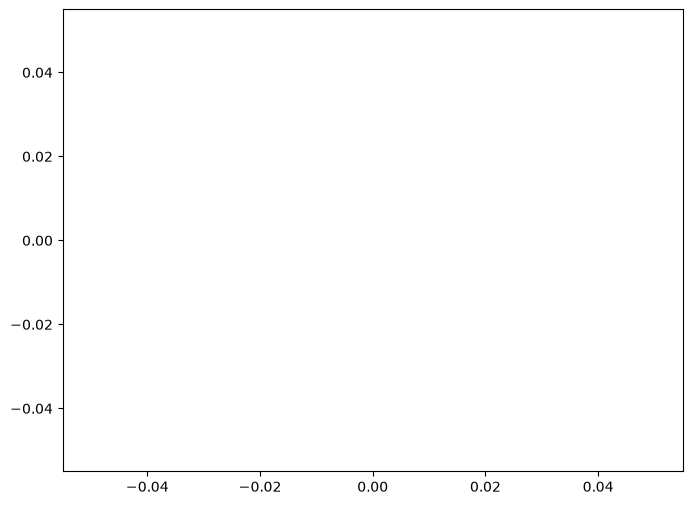

In [2]:
with open('/work/pi_grason_umass_edu/kboisjolie/cgshells/jobs/active/yaml.default', 'r') as defaultfile:
    yaml_path = defaultfile.readline().strip('\n')
    with open(yaml_path, 'r') as yamlfile:
        yaml_data = yaml.safe_load(yamlfile)

dimension = 2
dcore = yaml_data['dcore']
nshells = yaml_data['nshells']
t0 = yaml_data['t0_settings'] * dcore    # structural thickness
wx = yaml_data['wx_settings'] * dcore
r0 = yaml_data['curvetypes']
specieslist = yaml_data['species_list']
pair_ints = "1patch"
soft_ints = False
Nbeads = yaml_data['Nbeads_settings']
fraction = 1/3

sigma = yaml_data['sigma_settings'] #0.25 * dcore
Eadh = 1
khlist = yaml_data['subsequent_kh']
khlist.insert(0, yaml_data['initial_kh'][0])
#khlist = yaml_data['initial_kh']

# khlist = [100,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000]
# khlist = [1000]

minstyle = "cg"
etol = 1e-12

nshell_list = np.arange(1, nshells+1).tolist()

r0string = ''
for key, value in r0.items():
    r0string += str(key) + '=' + str(value)

fig, ax = plt.subplots(1,1,figsize=(8,6))

nminlist = []
khmin = []

for kh in khlist:
    
    nmols = []
    energies = []
    
    for nshells in nshell_list:
#         simpath = f"data/dynamics2D/{int(dimension)}d/emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{Nbeads}/r0-{r0:0.3f}/{pair_ints}-soft-{soft_ints}/Eadh-{Eadh:0.3f}/sigma-{sigma:0.5f}-kh-{kh:0.3f}/nshells-{nshells}/{minstyle}-{int(np.abs(np.log10(etol)))}"

#         simpath = f"data/dynamics2D/{int(dimension)}d/emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{Nbeads}/r0-{r0:0.3f}/{pair_ints}-soft-{soft_ints}/sigma-{sigma:0.5f}-kh-{kh:0.3f}/nshells-{nshells}/{minstyle}-{int(np.abs(np.log10(etol)))}"
        #/data/examples/2d/emin/wx-4.900-t0-0.600-Nbeads-15/fraction-0.333/species-1/r0-{'A': 2.0}/sigma-0.25000/kh-100.00000/nshells-7/cg-12
        #/data/examples/2d/emin/wx-4.900-t0-0.600-Nbeads-15/fraction-0.333/species-1/r0-{'A': 2.0}/sigma-0.25000/kh-100.00000/nshells-7/cg-12
        simpath = f"data/examples/{int(dimension)}d/emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{int(Nbeads)}/fraction-{fraction:0.3f}/species-{len(specieslist)}/r0-{r0string}/sigma-{sigma:0.5f}/kh-{kh:0.5f}/nshells-{nshells}/{minstyle}-{int(np.abs(np.log10(etol)))}"
    #         simpath = f"data/examples/{int(dimension)}d/emin/kh-{kh:0.2f}/nshells-{nshells}"
#         simpath = f"data/{int(dimension)}d/sigma-{sigma:0.3f}-kh-{kh:0.2f}/nshells-{nshells}"
#         simpath = f"data/{int(dimension)}d/wx-{wx:0.2f}-t0-{t0:0.2f}-r0-{r0:0.2f}-Nbeads-{Nbeads}-{pair_ints}/sigma-{sigma:0.3f}-kh-{kh:0.2f}/nshells-{nshells}"
#         simpath = f"data/{int(dimension)}d/stack-emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{Nbeads}-r0-{r0:0.3f}/{pair_ints}/sigma-{sigma:0.5f}-soft-{soft_ints}/kh-{kh:0.3f}/nshells-{nshells}"
        try:
            simdir = f"{PROJECT_ROOT}/{simpath}" 
            # logname = "logmd.lammps"
    #             logname = "logemin.lammps"
            result = ReadSim(simdir)
            result.read_log()
            ef = result.energyf    # final energy
            #ef = result.thermo[-1,5]    # final elastic (bond) energy
            energies.append(ef)
            nmols.append(nshells)
            
        except:
            print(f"{simdir}")
            pass
        
    nmols = np.array(nmols)
    energies = np.array(energies)
    ax.plot(nmols,energies/nmols,"o-",label=f"kh = {kh}")
    imin = np.argmin(energies/nmols)
    nmin = nmols[imin]
    emin = energies[imin]/nmin
    ax.plot(nmin,emin,"ko")
    nminlist.append(nmin)
    khmin.append(kh)

# ax.set_xlim(0,15)
#ax.set_ylim(-1,-0.5)
# ax.legend(fontsize = 12)
ax.tick_params(labelsize=15)
ax.set_xlabel("Stack Size N",fontsize=20)
ax.set_ylabel("Energy Density E/N",fontsize=20)

nu = yaml_data['nu']
d = wx/(Nbeads-1)
alpha = t0/d
kvkh = 2*(1-alpha**2 * nu)/(alpha**2 - nu)
kckh = nu*(1 + alpha**2)/(alpha**2 - nu)

print(f"kvkh: {kvkh}     |      kckh: {kckh}")

# Extracting information from single curvamer stacks, with different k0. over kh values

[{'A': 15.0, 'B': 15.0}, {'A': 12.76595744680851, 'B': 12.76595744680851}, {'A': 11.11111111111111, 'B': 11.11111111111111}, {'A': 9.836065573770492, 'B': 9.836065573770492}, {'A': 8.823529411764705, 'B': 8.823529411764705}]
/work/pi_grason_umass_edu/kboisjolie/cgshells/data/examples/2d/emin/wx-9.800-t0-0.600-Nbeads-30/fraction-0.333/species-2/pattern-AB/r0-A=15.0B=15.0/sigma-0.25000/kh-300.00000/nshells-1/hftn-12
/work/pi_grason_umass_edu/kboisjolie/cgshells/data/examples/2d/emin/wx-9.800-t0-0.600-Nbeads-30/fraction-0.333/species-2/pattern-AB/r0-A=15.0B=15.0/sigma-0.25000/kh-300.00000/nshells-2/hftn-12
/work/pi_grason_umass_edu/kboisjolie/cgshells/data/examples/2d/emin/wx-9.800-t0-0.600-Nbeads-30/fraction-0.333/species-2/pattern-AB/r0-A=15.0B=15.0/sigma-0.25000/kh-300.00000/nshells-3/hftn-12
/work/pi_grason_umass_edu/kboisjolie/cgshells/data/examples/2d/emin/wx-9.800-t0-0.600-Nbeads-30/fraction-0.333/species-2/pattern-AB/r0-A=15.0B=15.0/sigma-0.25000/kh-300.00000/nshells-4/hftn-12
/wo

ValueError: attempt to get argmin of an empty sequence

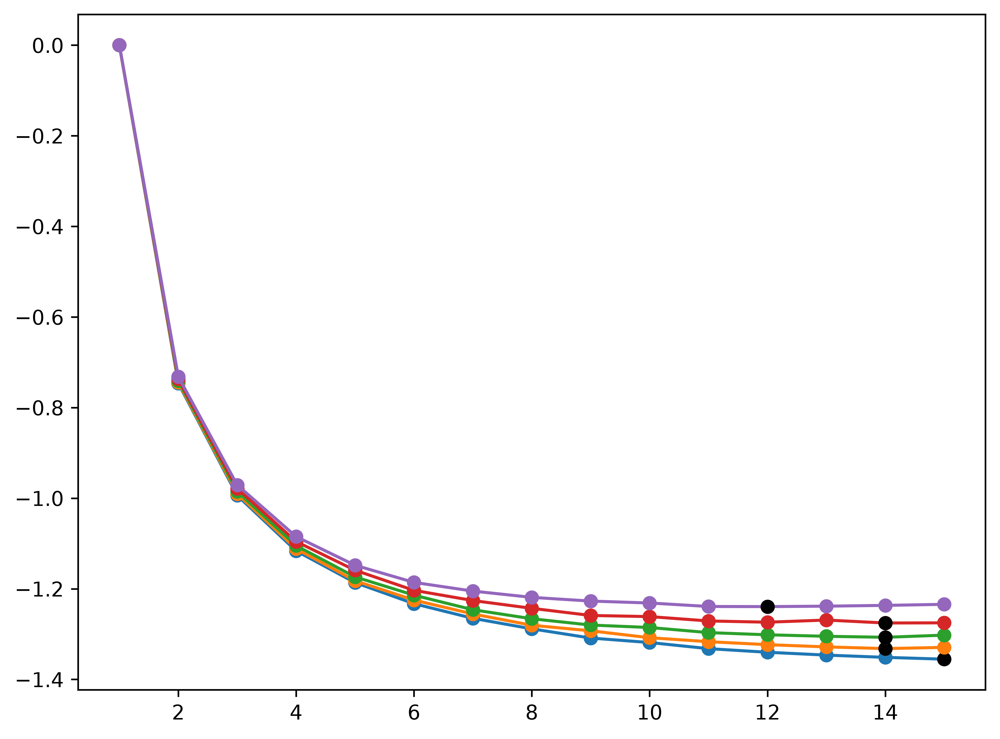

In [2]:
with open('/work/pi_grason_umass_edu/kboisjolie/cgshells/jobs/active/yaml.default', 'r') as defaultfile:
    yaml_path = defaultfile.readline().strip('\n')
    with open(yaml_path, 'r') as yamlfile:
        yaml_data = yaml.safe_load(yamlfile)

dimension = 2
dcore = yaml_data['dcore']
nshells = yaml_data['nshells']
t0 = yaml_data['t0_settings'] * dcore    # structural thickness
wx = yaml_data['wx_settings'] * dcore

specieslist = yaml_data['species_list']
pair_ints = "1patch"
soft_ints = False
Nbeads = yaml_data['Nbeads_settings']
fraction = 1/3

sigma = yaml_data['sigma_settings'] #0.25 * dcore
Eadh = 1
khlist = yaml_data['subsequent_kh']
khlist.insert(0, yaml_data['initial_kh'][0])
#khlist = yaml_data['initial_kh']

khlist = [200, 300, 400, 500, 600, 700, 800, 900, 1000]
# khlist = [1000]

minstyle = "hftn"
etol = 1e-12

nshell_list = np.arange(1, nshells+1).tolist()

nminlist = []
khmin = []

datalist = {}

###############################################
#### determining set of initial curvetypes ####
###############################################

k0endval = 1 / yaml_data["start_curvetypes"]['A']
k0startval = 1 / yaml_data["end_curvetypes"]['A']
num_within_range = yaml_data["num_within_range"]

k0middlerange = abs(k0endval - k0startval)

curvetypes_list = []

for count in range(num_within_range):
    k0iteration = ((k0middlerange / num_within_range) * count) + k0startval
    r0iteration = 1 / k0iteration
    curve = {'A': r0iteration, 'B': r0iteration}
    curvetypes_list.append(curve)

print(curvetypes_list)

fig, ax = plt.subplots(1,1,figsize=(8,6))

for kh in khlist:
    for curvetype in curvetypes_list:
        nmols = []
        energies = []
        r0 = curvetype
        r0string = ''
        for key, value in r0.items():
            r0string += str(key) + '=' + str(value)
            
        for nshells in nshell_list:
    #         simpath = f"data/dynamics2D/{int(dimension)}d/emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{Nbeads}/r0-{r0:0.3f}/{pair_ints}-soft-{soft_ints}/Eadh-{Eadh:0.3f}/sigma-{sigma:0.5f}-kh-{kh:0.3f}/nshells-{nshells}/{minstyle}-{int(np.abs(np.log10(etol)))}"
    
    #         simpath = f"data/dynamics2D/{int(dimension)}d/emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{Nbeads}/r0-{r0:0.3f}/{pair_ints}-soft-{soft_ints}/sigma-{sigma:0.5f}-kh-{kh:0.3f}/nshells-{nshells}/{minstyle}-{int(np.abs(np.log10(etol)))}"
            #/data/examples/2d/emin/wx-4.900-t0-0.600-Nbeads-15/fraction-0.333/species-1/r0-{'A': 2.0}/sigma-0.25000/kh-100.00000/nshells-7/cg-12
            #/data/examples/2d/emin/wx-4.900-t0-0.600-Nbeads-15/fraction-0.333/species-1/r0-{'A': 2.0}/sigma-0.25000/kh-100.00000/nshells-7/cg-12
            pattern = 'AB'
            simpath = f"data/examples/{int(dimension)}d/emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{int(Nbeads)}/fraction-{fraction:0.3f}/species-{len(specieslist)}/pattern-{pattern}/r0-{r0string}/sigma-{sigma:0.5f}/kh-{kh:0.5f}/nshells-{nshells}/{minstyle}-{int(np.abs(np.log10(etol)))}"
        #         simpath = f"data/examples/{int(dimension)}d/emin/kh-{kh:0.2f}/nshells-{nshells}"
    #         simpath = f"data/{int(dimension)}d/sigma-{sigma:0.3f}-kh-{kh:0.2f}/nshells-{nshells}"
    #         simpath = f"data/{int(dimension)}d/wx-{wx:0.2f}-t0-{t0:0.2f}-r0-{r0:0.2f}-Nbeads-{Nbeads}-{pair_ints}/sigma-{sigma:0.3f}-kh-{kh:0.2f}/nshells-{nshells}"
    #         simpath = f"data/{int(dimension)}d/stack-emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{Nbeads}-r0-{r0:0.3f}/{pair_ints}/sigma-{sigma:0.5f}-soft-{soft_ints}/kh-{kh:0.3f}/nshells-{nshells}"
            try:
                simdir = f"{PROJECT_ROOT}/{simpath}" 
                # logname = "logmd.lammps"
        #             logname = "logemin.lammps"
                result = ReadSim(simdir)
                result.read_log()
                ef = result.energyf    # final energy
                #ef = result.thermo[-1,5]    # final elastic (bond) energy
                energies.append(ef)
                nmols.append(nshells)
            except:
                print(f"{simdir}")
                pass
            
        nmols = np.array(nmols)
        energies = np.array(energies)
        ax.plot(nmols,energies/nmols,"o-",label=f"k0 = {1 / r0['A']}")
        imin = np.argmin(energies/nmols)
        nmin = nmols[imin]
        emin = energies[imin]/nmin
        ax.plot(nmin,emin,"ko")
        nminlist.append(nmin)
        khmin.append(kh)

        r0bar = r0['A']

        k0bar = 1 / r0bar
        deltak0 = abs((1/r0['A']) - (1/r0['B']))                  
        if k0bar in datalist:
            if deltak0 in datalist[k0bar]:
                if pattern in datalist[k0bar][deltak0]:
                    datalist[k0bar][deltak0][pattern][kh] = [nmols, energies, [nmin, emin]]
                else:
                    datalist[k0bar][deltak0][pattern] = {kh: [nmols, energies, [nmin, emin]]}
            else:
                datalist[k0bar][deltak0] = {pattern: {kh: [nmols, energies, [nmin, emin]]}}
        else:
            datalist[k0bar] = {deltak0: {pattern: {kh: [nmols, energies, [nmin, emin]]}}}

# ax.set_xlim(0,15)
#ax.set_ylim(-1,-0.5)
ax.legend(fontsize = 12)
ax.tick_params(labelsize=15)
ax.set_xlabel("Stack Size N",fontsize=20)
ax.set_ylabel("Energy Density E/N",fontsize=20)

nu = yaml_data['nu']
d = wx/(Nbeads-1)
alpha = t0/d
kvkh = 2*(1-alpha**2 * nu)/(alpha**2 - nu)
kckh = nu*(1 + alpha**2)/(alpha**2 - nu)

print(f"kvkh: {kvkh}     |      kckh: {kckh}")

# plotting self-limitation as a function of k0

[{'A': 20.0, 'B': 20.0}, {'A': 17.391304347826086, 'B': 17.391304347826086}, {'A': 15.384615384615383, 'B': 15.384615384615383}, {'A': 13.793103448275861, 'B': 13.793103448275861}, {'A': 12.5, 'B': 12.5}, {'A': 11.428571428571429, 'B': 11.428571428571429}, {'A': 10.526315789473685, 'B': 10.526315789473685}, {'A': 9.75609756097561, 'B': 9.75609756097561}, {'A': 9.090909090909092, 'B': 9.090909090909092}, {'A': 8.51063829787234, 'B': 8.51063829787234}]
[0.05, 0.0575, 0.065, 0.07250000000000001, 0.08, 0.0875, 0.09499999999999999, 0.10250000000000001, 0.10999999999999999, 0.11750000000000001]
[np.int64(30), np.int64(30), np.int64(30), np.int64(30), np.int64(30), np.int64(19), np.int64(16), np.int64(14), np.int64(12), np.int64(12)]
[0.05, 0.0575, 0.065, 0.07250000000000001, 0.08, 0.0875, 0.09499999999999999, 0.10250000000000001, 0.10999999999999999, 0.11750000000000001]
[np.int64(30), np.int64(30), np.int64(29), np.int64(30), np.int64(16), np.int64(15), np.int64(13), np.int64(11), np.int64(

Text(0, 0.5, 'N*')

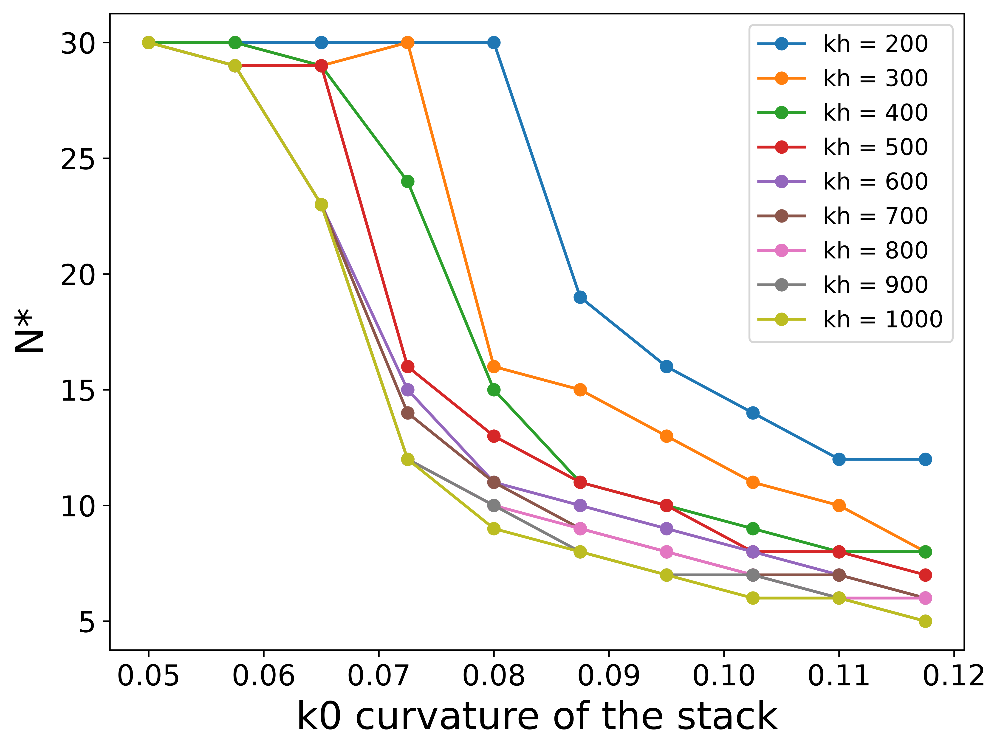

In [51]:
#print(datalist)

###############################################
#### determining set of initial curvetypes ####
###############################################

k0endval = 1 / yaml_data["start_curvetypes"]['A']
k0startval = 1 / yaml_data["end_curvetypes"]['A']
num_within_range = yaml_data["num_within_range"]

k0middlerange = abs(k0endval - k0startval)

curvetypes_list = []

for count in range(num_within_range):
    k0iteration = ((k0middlerange / num_within_range) * count) + k0startval
    r0iteration = 1 / k0iteration
    curve = {'A': r0iteration, 'B': r0iteration}
    curvetypes_list.append(curve)

print(curvetypes_list)

deltak0 = 0.0
pattern = 'AB'
kh_list = [200, 300, 400, 500, 600, 700, 800, 900, 1000]

x = []
y = []

fig, ax = plt.subplots(1,1,figsize=(8,6))

for kh in kh_list:
    for r0 in curvetypes_list:
        k0bar = 1 / r0['A']
        nmin = datalist[k0bar][deltak0][pattern][kh][2][0]
        emin = datalist[k0bar][deltak0][pattern][kh][2][1]
        x.append(k0bar)
        y.append(nmin)
        
    print(x)
    print(y)
    ax.plot(x,y,"o-",label=f"kh = {kh}")
    x = []
    y = []

ax.legend(fontsize = 12)
ax.tick_params(labelsize=15)
ax.set_xlabel("k0 curvature of the stack",fontsize=20)
ax.set_ylabel("N*",fontsize=20)

# plotting self limitation as a function of adhesion S

In [ ]:
### r0 = 25
#r0 = 6.5 * dcore
kh_list = np.array([200, 300, 400, 500, 600, 700, 800, 900, 1000])
eflat_list = np.array([0.34172005607667, 0.68344011215334, 1.02516016823001, 1.36688022430668, 1.70860028038335, 2.05032033646002, 2.39204039253669, 2.73376044861335, 3.07548050469002, 3.41720056076669, 3.75892061684337])

nmax = 70
mask = np.array(nminlist)<=nmax
eadh = 1
print(mask)
slist = ((t0+dcore) * eadh) / ( 2*eflat_list*r0 )
print(slist)

fig, ax = plt.subplots(1,1,figsize=(6,6))
# ax.plot(x25,y25,"o-",label = f"r0 = 25")
# ax.plot(slist[mask],np.array(nminlist)[mask],"o-",label = f"r0 = {r0}")

ax.plot(slist[mask],np.array(nminlist)[mask],"o-",label = f"sigma = {sigma}")

nconf = np.linspace(0.1,100,100)
hconf = 1*((t0+dcore)/r0)*nconf
ax.plot(1*sconformal(hconf),nconf,"k--",label = f"curv. foc.")

ax.set_xlim(0,0.1)
ax.set_ylim(0,30)
ax.legend(fontsize = 15)
ax.tick_params(labelsize=15)
ax.set_xlabel("$S = \gamma t / B \kappa_0$",fontsize=20)
ax.set_ylabel("N*",fontsize=20)

# Testing k0 listing code

In [2]:
with open('/work/pi_grason_umass_edu/kboisjolie/cgshells/jobs/active/yaml.default', 'r') as defaultfile:
    yaml_path = defaultfile.readline().strip('\n')
    with open(yaml_path, 'r') as yamlfile:
        yaml_data = yaml.safe_load(yamlfile)

###############################################
#### determining set of initial curvetypes ####
###############################################

k0endval = 1 / yaml_data["start_curvetypes"]['A']
k0startval = 1 / yaml_data["end_curvetypes"]['A']
num_within_range = yaml_data["num_within_range"]

k0middlerange = abs(k0endval - k0startval)

curvetypes_list = []

for count in range(num_within_range):
    k0iteration = ((k0middlerange / num_within_range) * count) + k0startval
    r0iteration = 1 / k0iteration
    curve = {'A': r0iteration, 'B': r0iteration}
    curvetypes_list.append(curve)

print(curvetypes_list)

for item in curvetypes_list:
    value = item['A']
    print("k0 = ", 1 / value)

[{'A': 15.0, 'B': 15.0}, {'A': 12.76595744680851, 'B': 12.76595744680851}, {'A': 11.11111111111111, 'B': 11.11111111111111}, {'A': 9.836065573770492, 'B': 9.836065573770492}, {'A': 8.823529411764705, 'B': 8.823529411764705}]
k0 =  0.06666666666666667
k0 =  0.07833333333333334
k0 =  0.09
k0 =  0.10166666666666667
k0 =  0.11333333333333334


# extracting information from a many k0 system with deltak0 between curvetypes

In [25]:
with open('/work/pi_grason_umass_edu/kboisjolie/cgshells/jobs/active/yaml.default', 'r') as defaultfile:
    yaml_path = defaultfile.readline().strip('\n')
    with open(yaml_path, 'r') as yamlfile:
        yaml_data = yaml.safe_load(yamlfile)

dimension = 2
dcore = yaml_data['dcore']
nshells = yaml_data['nshells']
t0 = yaml_data['t0_settings'] * dcore    # structural thickness
wx = yaml_data['wx_settings'] * dcore
#r0 = yaml_data['curvetypes']
specieslist = yaml_data['species_list']
pair_ints = "1patch"
soft_ints = False
Nbeads = yaml_data['Nbeads_settings']
fraction = 1/3
singlestacks = False

sigma = yaml_data['sigma_settings'] #0.25 * dcore
Eadh = 1

### kh list generation
khlist = yaml_data['subsequent_kh']
khlist.insert(0, yaml_data['initial_kh'][0])
#khlist = yaml_data['initial_kh']

# khlist = [100,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000]
# khlist = [1000]

### BEGIN: k0 list generation ###
##### DIFFERENT K0 LIST #####
# r0bar = 8.0
# deltar0 = 4.0
# k0bar = 1 / r0bar # average curvature 
# # maxdeltak0 = (deltar0 / r0bar) * (1 / r0bar) # largest value of delta k0 between two curvatures
# curve_steps = 10 # number of curvature changes between k0bar and maxdeltak0
pattern_list = yaml_data["patternlist"]

minstyle = "hftn"
etol = 1e-12

nshell_list = np.arange(1, nshells+1).tolist()

# r0string = ''
# for key, value in r0.items():
#     r0string += str(key) + '=' + str(value)

#fig, ax = plt.subplots(len(curvelist),1,figsize=(8,6))

nminlist = []
khmin = []
r0counter = 1

datalist = {}

minima_list = np.array([])

##### DIFFERENT K0 LIST #####
r0bar_list = yaml_data["r0bar"]

###############################################
#### determining set of initial curvetypes ####
###############################################

k0endval = 1 / yaml_data["start_curvetypes"]['A']
k0startval = 1 / yaml_data["end_curvetypes"]['A']
num_within_range = yaml_data["num_within_range"]

k0middlerange = abs(k0endval - k0startval)

curvetypes_list = []

for count in range(num_within_range):
    k0iteration = ((k0middlerange / num_within_range) * count) + k0startval
    r0iteration = 1 / k0iteration
    curve = {'A': r0iteration, 'B': r0iteration}
    curvetypes_list.append(curve)

print(curvetypes_list)

###############################################
####              begin loops              ####
###############################################

jobcounter = 0
pauseinterval = 5
pausetimesec = 15

for pattern in pattern_list:
    for curvetypes in curvetypes_list:
        ###########################################################
        ##### defining delta k0 list for this specific r0bar ######
        ###########################################################
        r0bar = curvetypes['A']
        deltar0 = yaml_data["deltar0"]
        k0bar = 1 / r0bar # average curvature 
        maxdeltak0 = 1 / deltar0  # largest value of delta k0 between two curvatures
        curve_steps = yaml_data["curve_steps"] # number of curvature changes between k0bar and maxdeltak0
        
        curvelist = []
        #bcurve has higher curvature 
        
        if singlestacks == False:
            for curve_step in range(curve_steps + 1):
                Acurve = 1 / (k0bar - ((maxdeltak0 / 2) / curve_steps) * curve_step)
                Bcurve = 1 / (k0bar + ((maxdeltak0 / 2) / curve_steps) * curve_step)
                
                #print(curve_step)
                curvelist.append({'A': Acurve, 'B': Bcurve})
        else:
            starting = 1 / 8
            ending = 1 / 20
            for curve_step in range(curve_steps + 1):
                Acurve = 1 / (starting + ((ending - starting) / curve_steps) * curve_step)
                Bcurve = 1 / (starting + ((ending - starting) / curve_steps) * curve_step)
                
                #print(curve_step)
                curvelist.append({'A': Acurve, 'B': Bcurve})
        
        curvelistload = list(curvelist)
        curvelistload.insert(0, {'A': (1/k0bar), 'B': (1/k0bar)})
        curvelistload.pop()  
        #print(curvelist)
        #print(curvelistload)

        ###########################################################
        ####  continued over patterns and specific delta k0s   ####
        ###########################################################
        
        for r0 in curvelist:
            # fig, ax = plt.subplots(figsize=(10, 6))
            r0string = ''
            for key, value in r0.items():
                r0string += str(key) + '=' + str(value)
            
            for kh in khlist:
                
                nmols = []
                energies = []
                
                for nshells in nshell_list:
            #         simpath = f"data/dynamics2D/{int(dimension)}d/emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{Nbeads}/r0-{r0:0.3f}/{pair_ints}-soft-{soft_ints}/Eadh-{Eadh:0.3f}/sigma-{sigma:0.5f}-kh-{kh:0.3f}/nshells-{nshells}/{minstyle}-{int(np.abs(np.log10(etol)))}"
            
            #         simpath = f"data/dynamics2D/{int(dimension)}d/emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{Nbeads}/r0-{r0:0.3f}/{pair_ints}-soft-{soft_ints}/sigma-{sigma:0.5f}-kh-{kh:0.3f}/nshells-{nshells}/{minstyle}-{int(np.abs(np.log10(etol)))}"
                    #/data/examples/2d/emin/wx-4.900-t0-0.600-Nbeads-15/fraction-0.333/species-1/r0-{'A': 2.0}/sigma-0.25000/kh-100.00000/nshells-7/cg-12
                    #/data/examples/2d/emin/wx-4.900-t0-0.600-Nbeads-15/fraction-0.333/species-1/r0-{'A': 2.0}/sigma-0.25000/kh-100.00000/nshells-7/cg-12
                    simpath = f"data/examples/{int(dimension)}d/emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{int(Nbeads)}/fraction-{fraction:0.3f}/species-{len(specieslist)}/pattern-{pattern}/k0bar-{str(((1 / r0['A']) + (1 / r0['B'])) / 2)}/r0-{r0string}/sigma-{sigma:0.5f}/kh-{kh:0.5f}/nshells-{nshells}/{minstyle}-{int(np.abs(np.log10(etol)))}"        
                #         simpath = f"data/examples/{int(dimension)}d/emin/kh-{kh:0.2f}/nshells-{nshells}"
            #         simpath = f"data/{int(dimension)}d/sigma-{sigma:0.3f}-kh-{kh:0.2f}/nshells-{nshells}"
            #         simpath = f"data/{int(dimension)}d/wx-{wx:0.2f}-t0-{t0:0.2f}-r0-{r0:0.2f}-Nbeads-{Nbeads}-{pair_ints}/sigma-{sigma:0.3f}-kh-{kh:0.2f}/nshells-{nshells}"
            #         simpath = f"data/{int(dimension)}d/stack-emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{Nbeads}-r0-{r0:0.3f}/{pair_ints}/sigma-{sigma:0.5f}-soft-{soft_ints}/kh-{kh:0.3f}/nshells-{nshells}"
                    try:
                        simdir = f"{PROJECT_ROOT}/{simpath}" 
                        # logname = "logmd.lammps"
                #             logname = "logemin.lammps"
                        result = ReadSim(simdir)
                        result.read_log()
                        ef = result.energyf    # final energy
                        #ef = result.thermo[-1,5]    # final elastic (bond) energy
                        energies.append(ef)
                        nmols.append(nshells)
                        
                    except:
                        print(f"{simdir}")
                        print(curvetypes['A'])
                        pass
                    
                nmols = np.array(nmols)
                energies = np.array(energies)
                # ax.plot(nmols,energies/nmols,"o-",label=f"kh = {kh}")
                imin = np.argmin(energies/nmols)
                nmin = nmols[imin]
                emin = energies[imin]/nmin
                # ax.plot(nmin,emin,"ko")
                # ax.tick_params(labelsize=15)
                # ax.set_xlabel("Stack Size N",fontsize=20)
                # ax.set_ylabel("Energy Density E/N",fontsize=20)
                nminlist.append(nmin)
                khmin.append(kh)
                k0bar = 1 / r0bar
                deltak0 = abs((1/r0['A']) - (1/r0['B']))
                print(deltak0)
                if k0bar in datalist:
                    if deltak0 in datalist[k0bar]:
                        if pattern in datalist[k0bar][deltak0]:
                            datalist[k0bar][deltak0][pattern][kh] = [nmols, energies, [nmin, emin]]
                        else:
                            datalist[k0bar][deltak0][pattern] = {kh: [nmols, energies, [nmin, emin]]}
                    else:
                        datalist[k0bar][deltak0] = {pattern: {kh: [nmols, energies, [nmin, emin]]}}
                else:
                    datalist[k0bar] = {deltak0: {pattern: {kh: [nmols, energies, [nmin, emin]]}}}
    
            print("delta k0: ", abs((1/r0['A']) - (1/r0['B'])))
            print("delta r0: ", r0)
            # plt.legend()
            # display(fig)
            # plt.close(fig)
        

# ax.set_xlim(0,15)
#ax.set_ylim(-1,-0.5)
# ax.legend(fontsize = 12)


nu = yaml_data['nu']
d = wx/(Nbeads-1)
alpha = t0/d
kvkh = 2*(1-alpha**2 * nu)/(alpha**2 - nu)
kckh = nu*(1 + alpha**2)/(alpha**2 - nu)

print(f"kvkh: {kvkh}     |      kckh: {kckh}")

[{'A': 15.0, 'B': 15.0}, {'A': 12.76595744680851, 'B': 12.76595744680851}, {'A': 11.11111111111111, 'B': 11.11111111111111}, {'A': 9.836065573770492, 'B': 9.836065573770492}, {'A': 8.823529411764705, 'B': 8.823529411764705}]
0.0
0.0
delta k0:  0.0
delta r0:  {'A': 15.0, 'B': 15.0}
0.0017142857139428591
0.0017142857139428591
delta k0:  0.0017142857139428591
delta r0:  {'A': 15.195369030351156, 'B': 14.80959097323929}
0.0034285714278857182
0.0034285714278857182
delta k0:  0.0034285714278857182
delta r0:  {'A': 15.395894428071225, 'B': 14.623955431828199}
0.005142857141828577
0.005142857141828577
delta k0:  0.005142857141828577
delta r0:  {'A': 15.601783060796064, 'B': 14.442916093642355}
0.0068571428557714365
0.0068571428557714365
delta k0:  0.0068571428557714365
delta r0:  {'A': 15.813253011876725, 'B': 14.266304347965647}
0.008571428569714289
0.008571428569714289
delta k0:  0.008571428569714289
delta r0:  {'A': 16.03053435092477, 'B': 14.093959731713886}
0.01028571428365714
0.010285714

# Plotting

/tmp/ipykernel_1149605/2565943344.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.
  ax.plot(minimapoint[0],minimapoint[1],"ko", color='darkred')
/tmp/ipykernel_1149605/2565943344.py:77: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.
  ax.plot(minimapoint[0],minimapoint[1],"ko", color='darkblue')


average r0:  15.0


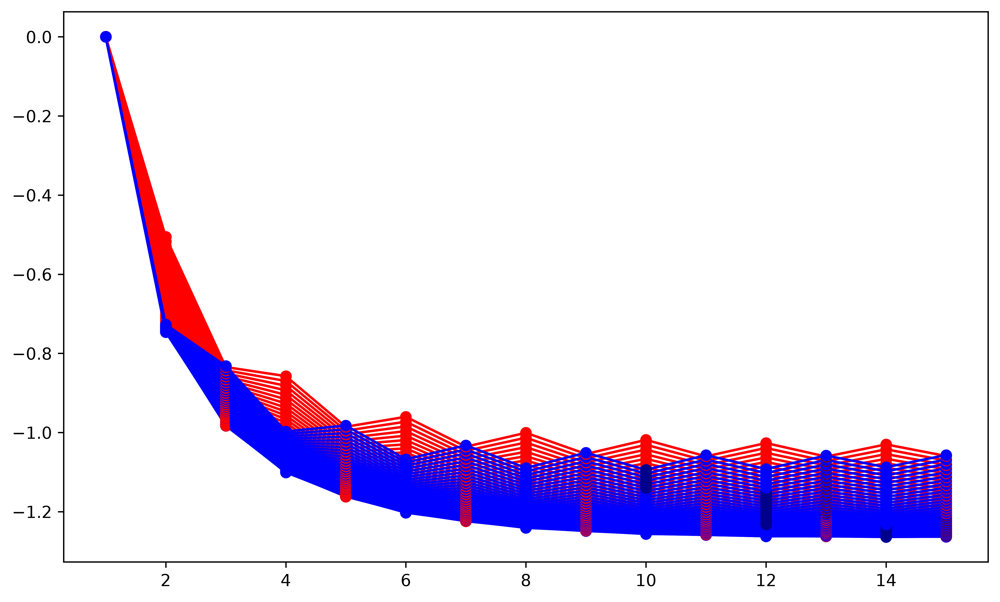

average r0:  12.76595744680851


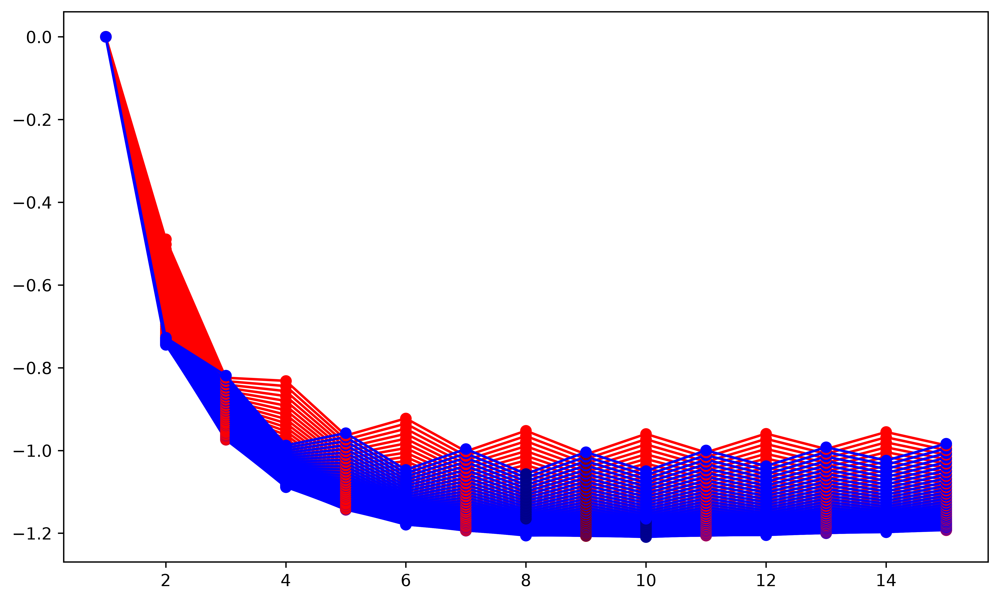

average r0:  11.11111111111111


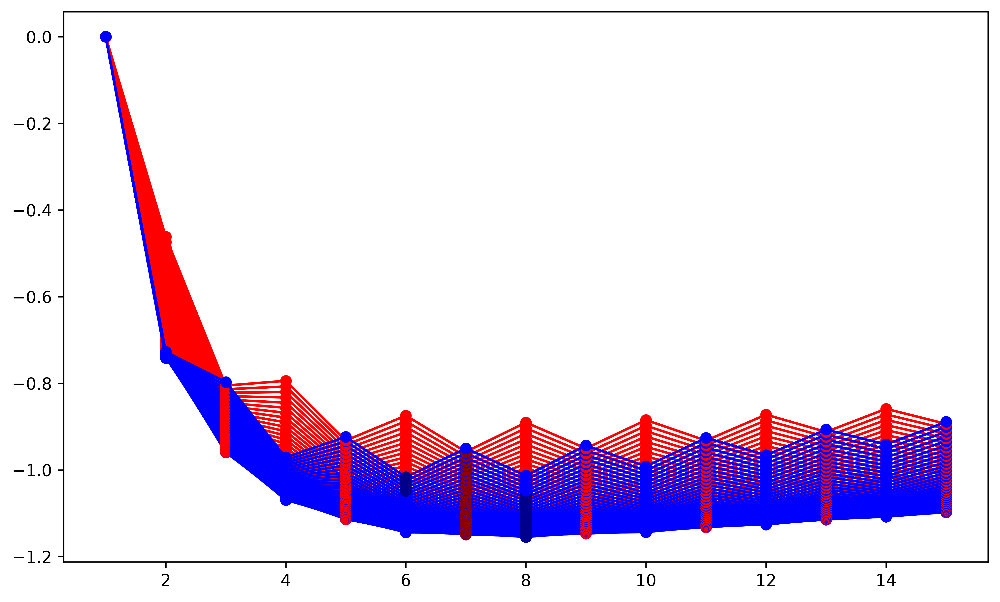

average r0:  9.836065573770492


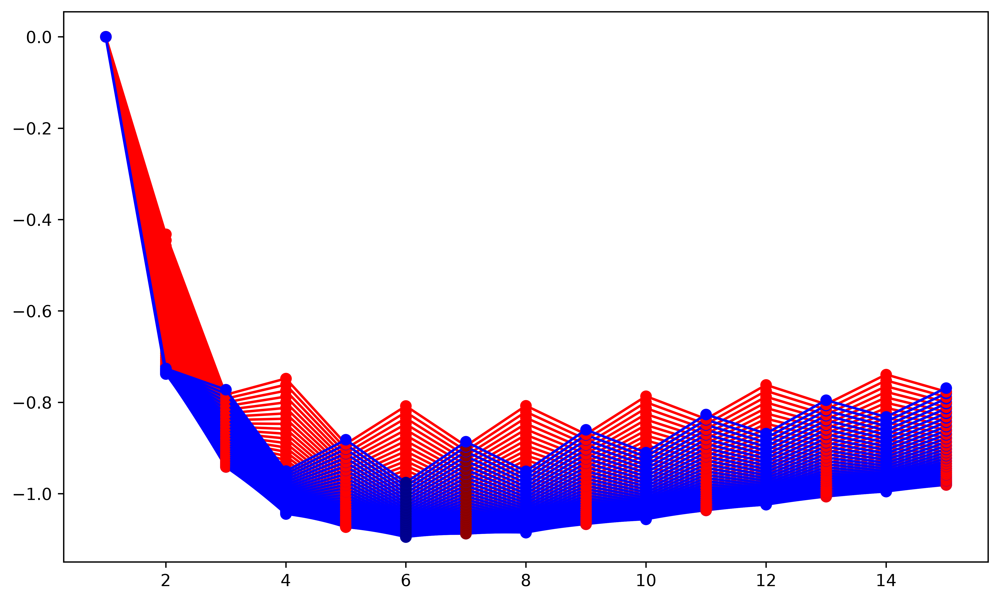

average r0:  8.823529411764705


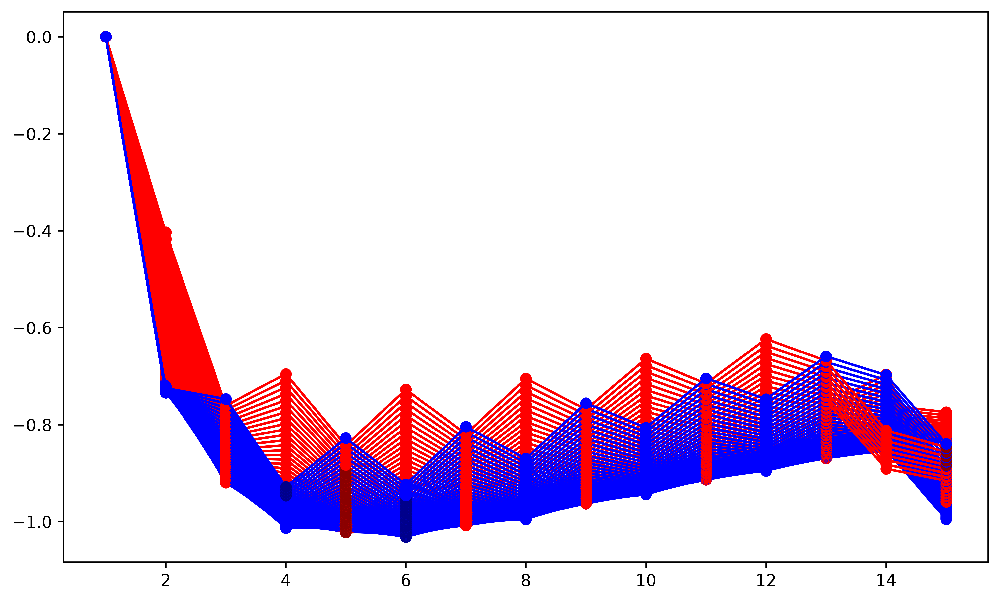

In [28]:
#print(datalist)

###############################################
#### determining set of initial curvetypes ####
###############################################

k0endval = 1 / yaml_data["start_curvetypes"]['A']
k0startval = 1 / yaml_data["end_curvetypes"]['A']
num_within_range = yaml_data["num_within_range"]

k0middlerange = abs(k0endval - k0startval)

curvetypes_list = []

for count in range(num_within_range):
    k0iteration = ((k0middlerange / num_within_range) * count) + k0startval
    r0iteration = 1 / k0iteration
    curve = {'A': r0iteration, 'B': r0iteration}
    curvetypes_list.append(curve)

#print(curvetypes_list)

for curvetypes in curvetypes_list:
    ###########################################################
    ##### defining delta k0 list for this specific r0bar ######
    ###########################################################
    r0bar = curvetypes['A']
    deltar0 = yaml_data["deltar0"]
    k0bar = 1 / r0bar # average curvature 
    maxdeltak0 = 1 / deltar0  # largest value of delta k0 between two curvatures
    curve_steps = yaml_data["curve_steps"] # number of curvature changes between k0bar and maxdeltak0
    
    curvelist = []
    #bcurve has higher curvature 
    
    if singlestacks == False:
        for curve_step in range(curve_steps + 1):
            Acurve = 1 / (k0bar - ((maxdeltak0 / 2) / curve_steps) * curve_step)
            Bcurve = 1 / (k0bar + ((maxdeltak0 / 2) / curve_steps) * curve_step)
            
            #print(curve_step)
            curvelist.append({'A': Acurve, 'B': Bcurve})
    else:
        starting = 1 / 8
        ending = 1 / 20
        for curve_step in range(curve_steps + 1):
            Acurve = 1 / (starting + ((ending - starting) / curve_steps) * curve_step)
            Bcurve = 1 / (starting + ((ending - starting) / curve_steps) * curve_step)
            
            #print(curve_step)
            curvelist.append({'A': Acurve, 'B': Bcurve})
        
    curvelistload = list(curvelist)
    curvelistload.insert(0, {'A': (1/k0bar), 'B': (1/k0bar)})
    curvelistload.pop()  
    #print(curvelist)
    #print(curvelistload)
    
    #print(curvelist)
    fig, ax = plt.subplots(figsize=(10, 6))
    
    for r0 in curvelist:
        k0bar = 1 / curvetypes['A']
        deltak0 = abs((1/r0['A']) - (1/r0['B']))
        #print(deltak0)

        n = datalist[k0bar][deltak0]['AB'][1000][0]
        eab = datalist[k0bar][deltak0]['AB'][1000][1]
        minimapoint = datalist[k0bar][deltak0]['AB'][1000][2]
        ax.plot(n,eab/n,"o-",label=f"dk0={deltak0}|k0bar={k0bar}", color='red')
        ax.plot(minimapoint[0],minimapoint[1],"ko", color='darkred')
        
        n = datalist[k0bar][deltak0]['BA'][1000][0]
        eba = datalist[k0bar][deltak0]['BA'][1000][1]
        minimapoint = datalist[k0bar][deltak0]['BA'][1000][2]
        ax.plot(n,eba/n,"o-",label=f"2dk0={deltak0}|k0bar={k0bar}", color='blue')
        ax.plot(minimapoint[0],minimapoint[1],"ko", color='darkblue')

        ab_e_dens_list = eab / n
        ba_e_dens_list = eba / n

        lowest_from_pairing = np.array([])
        
        for index in range(len(ab_e_dens_list)):
            ab_e_dens = ab_e_dens_list[index]
            ba_e_dens = ba_e_dens_list[index]

            if ab_e_dens < ba_e_dens:
                #print(eab[index])
                lowest_from_pairing = np.append(lowest_from_pairing, eab[index])

            if ba_e_dens < ab_e_dens:
                #print(eba[index])
                lowest_from_pairing = np.append(lowest_from_pairing, eba[index])
                
            if ba_e_dens == ab_e_dens:
                #print("neither")
                lowest_from_pairing = np.append(lowest_from_pairing, eba[index])
        nmols = n
        emin_dens = np.min(lowest_from_pairing / nmols)
        
        eminindex = np.where((lowest_from_pairing / nmols) == emin_dens)[0][0]
        emin = lowest_from_pairing[eminindex]
        #print("index: ", eminindex)
        #print("emin: ", emin)
        nmin = nmols[eminindex]
        emin = emin_dens
        datalist[k0bar][deltak0]['combined'] = {1000: [nmols, lowest_from_pairing, [nmin, emin]]}
    print("average r0: ", r0bar)
    #plt.legend()

    display(fig)
    plt.close(fig)


                
# plt.legend()
# display(fig)
# plt.close(fig)

# print(datalist[0.06666666666666667][0.0]['AB'][1000])

# n = datalist[0.06666666666666667][0.0]['AB'][1000][0]
# e = datalist[0.06666666666666667][0.0]['AB'][1000][1]
# print(len(e))
# print(len(n))

# minimapoint = datalist[0.06666666666666667][0.0]['AB'][1000][2]
# ax.plot(n,e/n,"o-",label=f"delta k0 = {k0bar}")
# ax.plot(minimapoint[0],minimapoint[1],"ko")
# plt.legend()
# display(fig)
plt.close(fig)


/tmp/ipykernel_1149605/332579506.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.
  ax.plot(minimapoint[0],minimapoint[1],"ko", color='blue')


average r0:  15.0


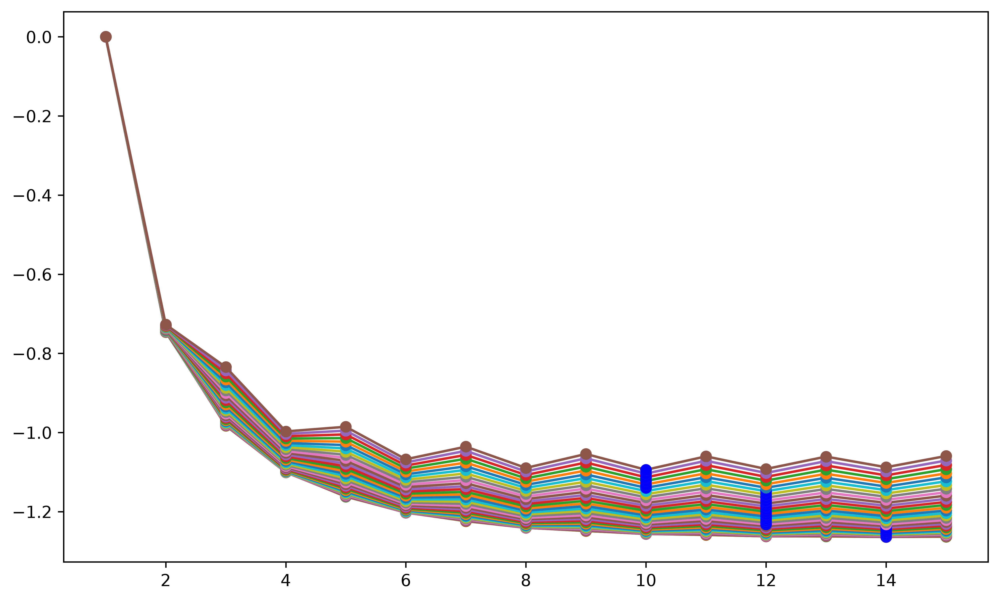

average r0:  12.76595744680851


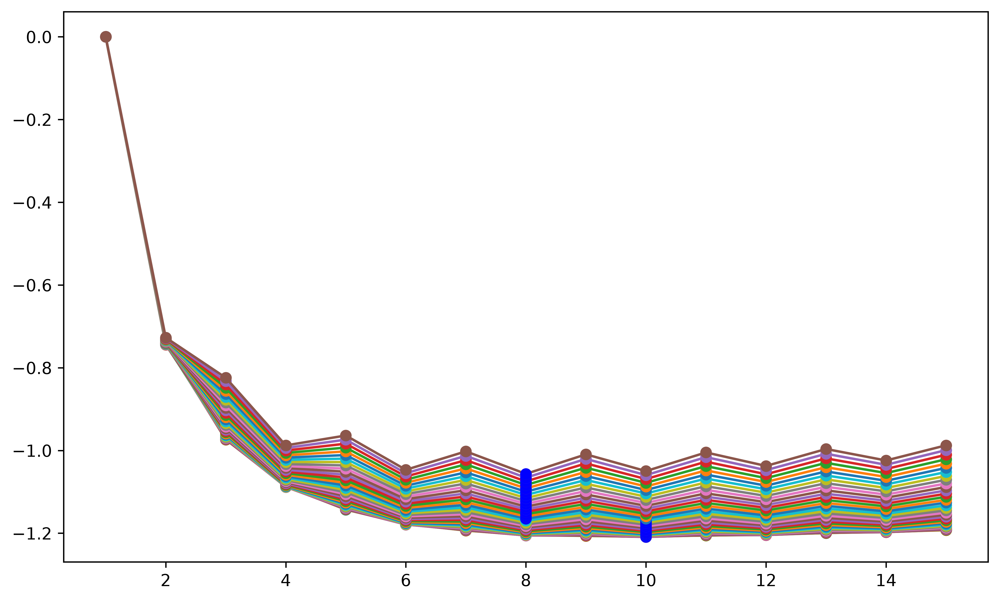

average r0:  11.11111111111111


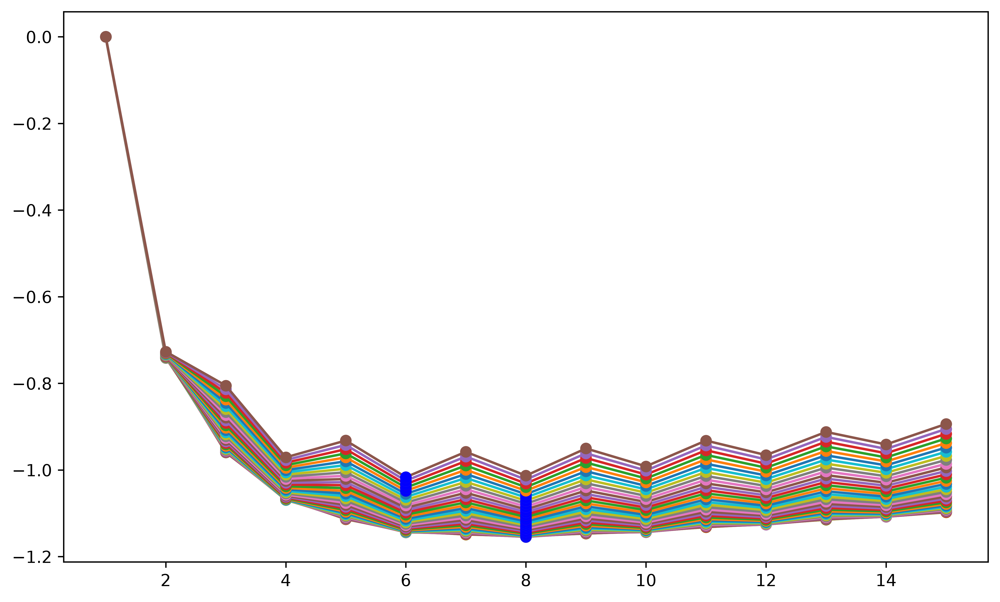

average r0:  9.836065573770492


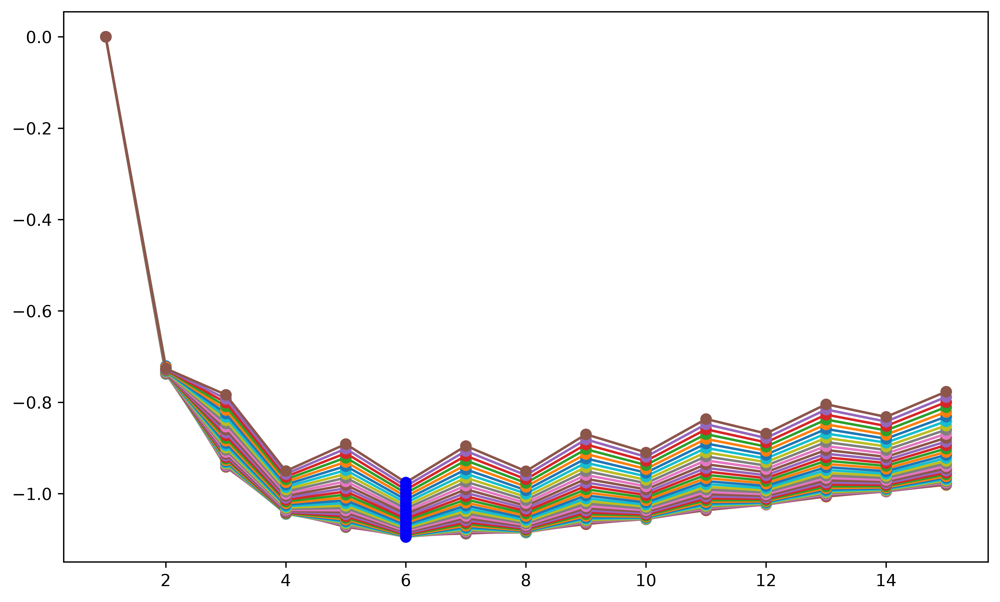

average r0:  8.823529411764705


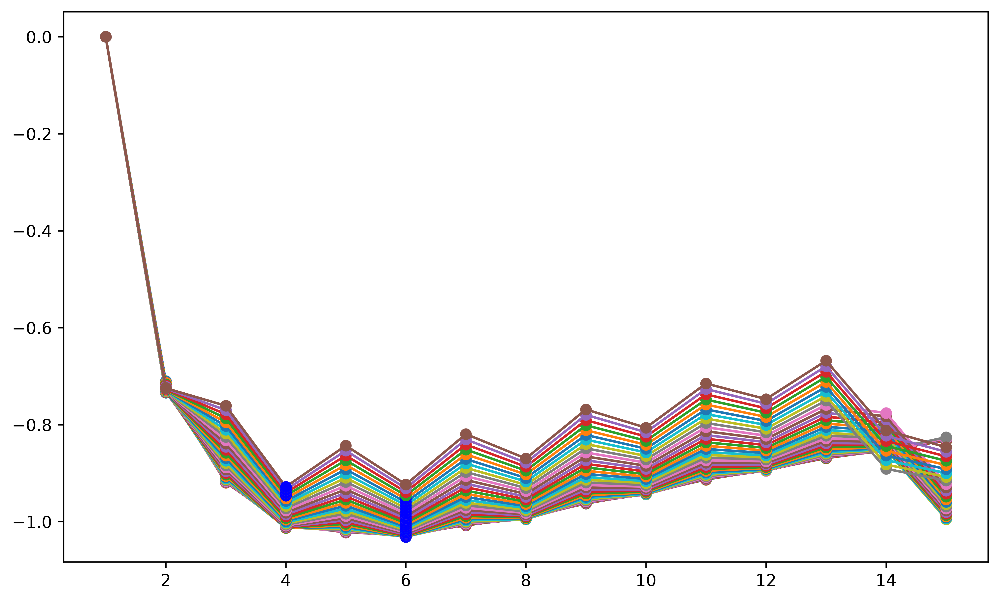

In [29]:
#print(datalist)

###############################################
#### determining set of initial curvetypes ####
###############################################

k0endval = 1 / yaml_data["start_curvetypes"]['A']
k0startval = 1 / yaml_data["end_curvetypes"]['A']
num_within_range = yaml_data["num_within_range"]

k0middlerange = abs(k0endval - k0startval)

curvetypes_list = []

for count in range(num_within_range):
    k0iteration = ((k0middlerange / num_within_range) * count) + k0startval
    r0iteration = 1 / k0iteration
    curve = {'A': r0iteration, 'B': r0iteration}
    curvetypes_list.append(curve)

#print(curvetypes_list)

for curvetypes in curvetypes_list:
    ###########################################################
    ##### defining delta k0 list for this specific r0bar ######
    ###########################################################
    r0bar = curvetypes['A']
    deltar0 = yaml_data["deltar0"]
    k0bar = 1 / r0bar # average curvature 
    maxdeltak0 = 1 / deltar0  # largest value of delta k0 between two curvatures
    curve_steps = yaml_data["curve_steps"] # number of curvature changes between k0bar and maxdeltak0
    
    curvelist = []
    #bcurve has higher curvature 
    
    if singlestacks == False:
        for curve_step in range(curve_steps + 1):
            Acurve = 1 / (k0bar - ((maxdeltak0 / 2) / curve_steps) * curve_step)
            Bcurve = 1 / (k0bar + ((maxdeltak0 / 2) / curve_steps) * curve_step)
            
            #print(curve_step)
            curvelist.append({'A': Acurve, 'B': Bcurve})
    else:
        starting = 1 / 8
        ending = 1 / 20
        for curve_step in range(curve_steps + 1):
            Acurve = 1 / (starting + ((ending - starting) / curve_steps) * curve_step)
            Bcurve = 1 / (starting + ((ending - starting) / curve_steps) * curve_step)
            
            #print(curve_step)
            curvelist.append({'A': Acurve, 'B': Bcurve})
        
    curvelistload = list(curvelist)
    curvelistload.insert(0, {'A': (1/k0bar), 'B': (1/k0bar)})
    curvelistload.pop()  
    #print(curvelist)
    #print(curvelistload)
    
    #print(curvelist)
    fig, ax = plt.subplots(figsize=(10, 6))
    
    for r0 in curvelist:
        k0bar = 1 / curvetypes['A']
        deltak0 = abs((1/r0['A']) - (1/r0['B']))
        #print(deltak0)

        n = datalist[k0bar][deltak0]['combined'][1000][0]
        eab = datalist[k0bar][deltak0]['combined'][1000][1]
        minimapoint = datalist[k0bar][deltak0]['combined'][1000][2]
        ax.plot(n,eab/n,"o-",label=f"dk0={deltak0}|k0bar={k0bar}")
        ax.plot(minimapoint[0],minimapoint[1],"ko", color='blue')

        ab_e_dens_list = eab / n
        ba_e_dens_list = eba / n

        lowest_from_pairing = np.array([])
        
    #plt.legend()
    print("average r0: ", r0bar)
    display(fig)
    plt.close(fig)


                
# plt.legend()
# display(fig)
# plt.close(fig)

# print(datalist[0.06666666666666667][0.0]['AB'][1000])

# n = datalist[0.06666666666666667][0.0]['AB'][1000][0]
# e = datalist[0.06666666666666667][0.0]['AB'][1000][1]
# print(len(e))
# print(len(n))

# minimapoint = datalist[0.06666666666666667][0.0]['AB'][1000][2]
# ax.plot(n,e/n,"o-",label=f"delta k0 = {k0bar}")
# ax.plot(minimapoint[0],minimapoint[1],"ko")
# plt.legend()
# display(fig)
plt.close(fig)


In [ ]:
#print(datalist)

khfocus = 100
for khfocus in [1000]:
    fig, ax = plt.subplots(figsize=(10, 6))
    print(khfocus)
    for r0 in curvelist:
        deltak0 = abs((1/r0['A']) - (1/r0['B']))
        nshells = datalist[deltak0][khfocus][0]
        energies = datalist[deltak0][khfocus][1]
        minimapoint = datalist[deltak0][khfocus][2]
        ax.plot(nmols,energies/nmols,"o-",label=f"delta k0 = {deltak0}")
        ax.plot(minimapoint[0],minimapoint[1],"ko")
        #print(r0)
    
    ax.tick_params(labelsize=15)
    ax.set_xlabel("Stack Size N",fontsize=20)
    ax.set_ylabel("Energy Density E/N",fontsize=20)
    
    plt.legend()
    display(fig)
    plt.close(fig)

average r0:  15.0
average r0:  12.76595744680851
average r0:  11.11111111111111
average r0:  9.836065573770492
average r0:  8.823529411764705


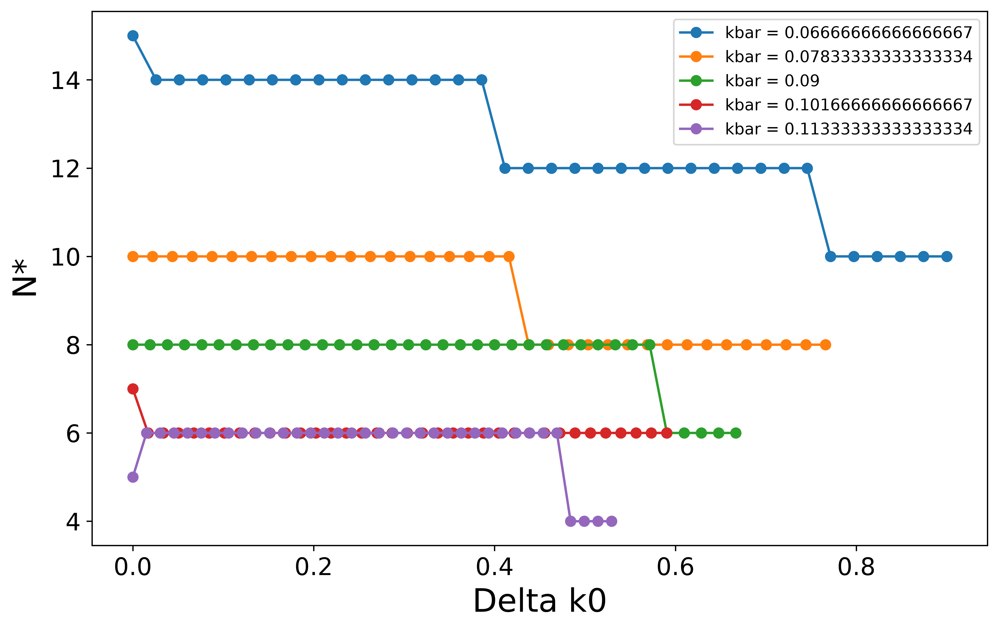

In [46]:
#print(datalist)
fig, ax = plt.subplots(figsize=(10, 6))
for curvetypes in curvetypes_list:
    ###########################################################
    ##### defining delta k0 list for this specific r0bar ######
    ###########################################################
    r0bar = curvetypes['A']
    deltar0 = yaml_data["deltar0"]
    k0bar = 1 / r0bar # average curvature 
    maxdeltak0 = 1 / deltar0  # largest value of delta k0 between two curvatures
    curve_steps = yaml_data["curve_steps"] # number of curvature changes between k0bar and maxdeltak0
    
    curvelist = []
    #bcurve has higher curvature 
    
    if singlestacks == False:
        for curve_step in range(curve_steps + 1):
            Acurve = 1 / (k0bar - ((maxdeltak0 / 2) / curve_steps) * curve_step)
            Bcurve = 1 / (k0bar + ((maxdeltak0 / 2) / curve_steps) * curve_step)
            
            #print(curve_step)
            curvelist.append({'A': Acurve, 'B': Bcurve})
    else:
        starting = 1 / 8
        ending = 1 / 20
        for curve_step in range(curve_steps + 1):
            Acurve = 1 / (starting + ((ending - starting) / curve_steps) * curve_step)
            Bcurve = 1 / (starting + ((ending - starting) / curve_steps) * curve_step)
            
            #print(curve_step)
            curvelist.append({'A': Acurve, 'B': Bcurve})
        
    curvelistload = list(curvelist)
    curvelistload.insert(0, {'A': (1/k0bar), 'B': (1/k0bar)})
    curvelistload.pop()  
    #print(curvelist)
    #print(curvelistload)
    
    #print(curvelist)
    #fig, ax = plt.subplots(figsize=(10, 6))
    
    #print(khfocus)
    nstar = []
    deltak0list = []
    k0barlist = []
    
    for r0 in curvelist:
        k0bar = 1 / curvetypes['A']
        deltak0 = abs((1/r0['A']) - (1/r0['B']))
        deltak0list.append(deltak0)
        k0barlist.append(k0bar)
        minimapoint = datalist[k0bar][deltak0]['combined'][1000][2]
        nstar.append(minimapoint[0])
        #print(r0)
    ax.plot(np.array(deltak0list) / np.array(k0barlist), nstar,"o-",label=f"kbar = {k0bar}")
    
    #plt.legend()
    print("average r0: ", r0bar)
    #display(fig)


ax.tick_params(labelsize=15)
ax.set_xlabel("Delta k0",fontsize=20)
ax.set_ylabel("N*",fontsize=20)
#ax.plot(deltak0list, minimaenergy,"o-",label=f"k0bar = {k0bar}")

plt.legend()
display(fig)
plt.close(fig)

average r0:  15.0
average r0:  12.76595744680851
average r0:  11.11111111111111
average r0:  9.836065573770492
average r0:  8.823529411764705


/tmp/ipykernel_1149605/17202038.py:67: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.
  ax.plot(mmedeltak0, mmenergy, "ko", color='black')


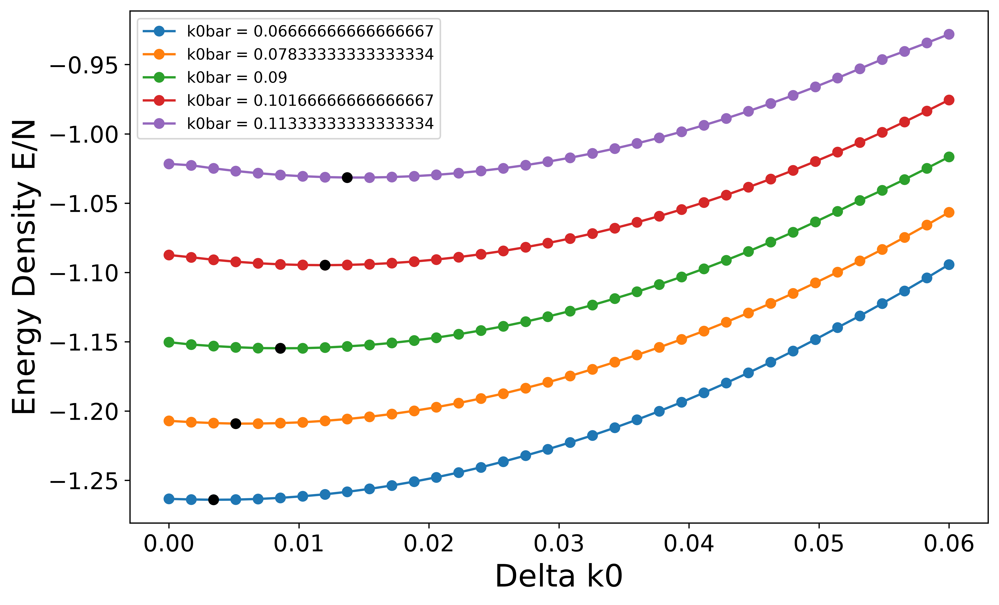

minima energies:  [np.float64(-1.2639797797686358), np.float64(-1.20905042533632), np.float64(-1.1546760605132063), np.float64(-1.094730702955), np.float64(-1.0314987929275017)]
minima deltak0:  [0.0034285714278857182, 0.005142857141828577, 0.008571428569714296, 0.011999999997599986, 0.013714285711542831]
minima k0bar:  [0.06666666666666667, 0.07833333333333334, 0.09, 0.10166666666666667, 0.11333333333333334]


In [7]:
#print(datalist)

mmenergy_list = []
mmedeltak0_list = []
k0bar_list = []

fig, ax = plt.subplots(figsize=(10, 6))

for curvetypes in curvetypes_list:
    ###########################################################
    ##### defining delta k0 list for this specific r0bar ######
    ###########################################################
    r0bar = curvetypes['A']
    deltar0 = yaml_data["deltar0"]
    k0bar = 1 / r0bar # average curvature 
    maxdeltak0 = 1 / deltar0  # largest value of delta k0 between two curvatures
    curve_steps = yaml_data["curve_steps"] # number of curvature changes between k0bar and maxdeltak0
    
    curvelist = []
    #bcurve has higher curvature 
    
    if singlestacks == False:
        for curve_step in range(curve_steps + 1):
            Acurve = 1 / (k0bar - ((maxdeltak0 / 2) / curve_steps) * curve_step)
            Bcurve = 1 / (k0bar + ((maxdeltak0 / 2) / curve_steps) * curve_step)
            
            #print(curve_step)
            curvelist.append({'A': Acurve, 'B': Bcurve})
    else:
        starting = 1 / 8
        ending = 1 / 20
        for curve_step in range(curve_steps + 1):
            Acurve = 1 / (starting + ((ending - starting) / curve_steps) * curve_step)
            Bcurve = 1 / (starting + ((ending - starting) / curve_steps) * curve_step)
            
            #print(curve_step)
            curvelist.append({'A': Acurve, 'B': Bcurve})
        
    curvelistload = list(curvelist)
    curvelistload.insert(0, {'A': (1/k0bar), 'B': (1/k0bar)})
    curvelistload.pop()  
    #print(curvelist)
    #print(curvelistload)
    
    #print(curvelist)
    
    #print(khfocus)

    deltak0list = []
    minimaenergy = []
    k0bar = 1 / curvetypes['A']
    for r0 in curvelist:
        deltak0 = abs((1/r0['A']) - (1/r0['B']))
        deltak0list.append(deltak0)
        minimapoint = datalist[k0bar][deltak0]['combined'][1000][2]
        minimaenergy.append(minimapoint[1])
        #print(r0)
    print("average r0: ", r0bar)
    ax.plot(deltak0list, minimaenergy,"o-",label=f"k0bar = {k0bar}")
    mmenergy = np.min(minimaenergy)
    mmeindex = np.where(minimaenergy == mmenergy)[0][0]
    mmedeltak0 = deltak0list[mmeindex]
    mmenergy_list.append(mmenergy)
    mmedeltak0_list.append(mmedeltak0)
    k0bar_list.append(k0bar)

    ax.plot(mmedeltak0, mmenergy, "ko", color='black')
    
ax.tick_params(labelsize=15)
ax.set_xlabel("Delta k0",fontsize=20)
ax.set_ylabel("Energy Density E/N",fontsize=20)

plt.legend()
plt.show()
plt.close(fig)

print("minima energies: ", mmenergy_list)
print("minima deltak0: ", mmedeltak0_list)
print("minima k0bar: ", k0bar_list)

In [8]:
delta_k0 = 0.013714285711542831 #0.006, 0.012, 0.02 
k0bar = 0.11333333333333334 #k0bar: 0.08
Acurve = k0bar - delta_k0
Bcurve = k0bar + delta_k0

r0 = [(1 / Acurve), (1 / Bcurve)] 
print(r0)

[10.038240917505636, 7.871064467936049]


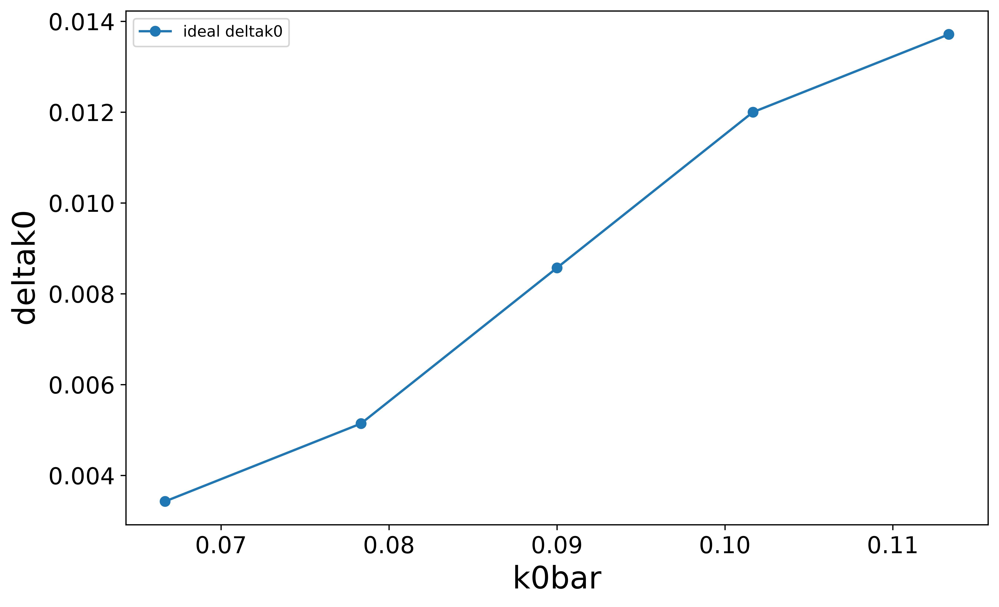

In [9]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(k0bar_list, mmedeltak0_list, "o-", label=f"ideal deltak0")

ax.tick_params(labelsize=15)
ax.set_xlabel("k0bar",fontsize=20)
ax.set_ylabel("deltak0",fontsize=20)

plt.legend()
plt.show()
plt.close(fig)

In [16]:
deltak0 = 0.013714285711542831
k0bar = 0.11333333333333334

Acurve = (k0bar - ((deltak0 / 2)))
Bcurve = (k0bar + ((deltak0 / 2)))
print(t0)

imc_pos = 1 / (((1 / Bcurve) + t0))
imc_neg = 1 / (((1 / Bcurve) - t0))

print(Bcurve)
print(imc_pos)
print(imc_neg)
print(Acurve)

0.6
0.12019047618910475
0.1121060299174367
0.129531551503108
0.10647619047756193


[1.00000000e+000 2.68811714e+023 7.22597377e+046 1.94242640e+070
 5.22146969e+093 1.40359222e+117 3.77302030e+140 1.01423205e+164
 2.72637457e+187 7.32881422e+210 1.97007111e+234 5.29578193e+257
 1.42356822e+281 3.82671813e+304]


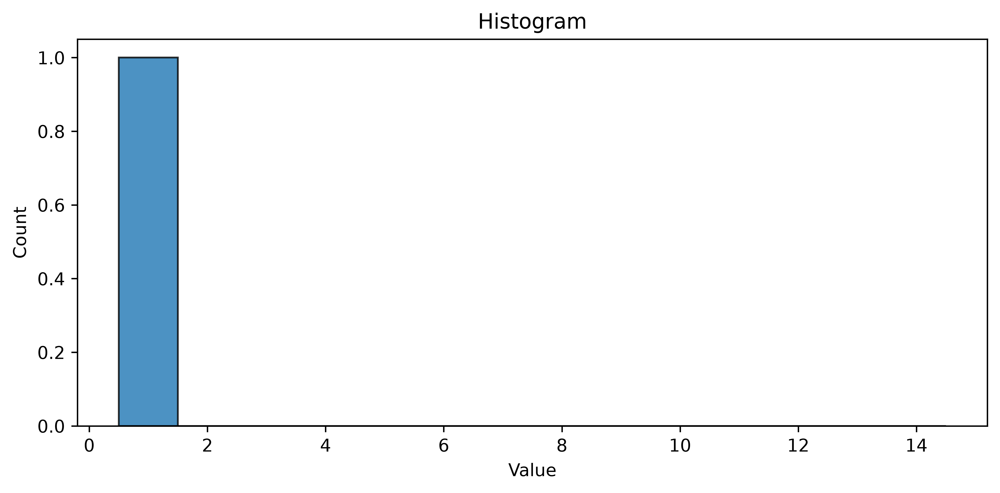

In [43]:
import math
e = math.e
from scipy.constants import k as boltzmann_constant

totalphi = 0.15
kT = 0.1
monomer_phi = 1e-20
deltak0 = 0.013714285711542831
k0bar = 0.11333333333333334

energy = datalist[k0bar][deltak0]['combined'][1000][1]

phi_n = []

for n in np.arange(1, 15):
    negbeta = (1 / kT)

    stackenergy = (energy[n] / n)
    stackenergy = (1 / kT) * (-1 + 1 / n) 

    phi_at_n = ((monomer_phi * (e ** (-negbeta * stackenergy))) ** n)
    phi_n.append(phi_at_n)

print(np.array(phi_n) / monomer_phi)
plt.figure(figsize=(8, 4))
bins = np.arange(0.5, 15.5, 1)
plt.hist(np.array(phi_n) / monomer_phi, bins=bins, edgecolor="black", alpha=0.8)

plt.title("Histogram")
plt.xlabel("Value")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

In [21]:
import random
shells = 30
curveseries = []

for i in range(shells):
    choice = random.choices(['A', 'B'])[0]
    if 0 >= len(curveseries):
        curveseries.append(choice)
    else:
        newstring = curveseries[i - 1] + choice
        curveseries.append(newstring)
        
print(curveseries)

['B', 'BA', 'BAA', 'BAAA', 'BAAAB', 'BAAABA', 'BAAABAA', 'BAAABAAA', 'BAAABAAAB', 'BAAABAAABB', 'BAAABAAABBA', 'BAAABAAABBAB', 'BAAABAAABBABB', 'BAAABAAABBABBA', 'BAAABAAABBABBAB', 'BAAABAAABBABBABB', 'BAAABAAABBABBABBA', 'BAAABAAABBABBABBAA', 'BAAABAAABBABBABBAAB', 'BAAABAAABBABBABBAABB', 'BAAABAAABBABBABBAABBB', 'BAAABAAABBABBABBAABBBB', 'BAAABAAABBABBABBAABBBBA', 'BAAABAAABBABBABBAABBBBAA', 'BAAABAAABBABBABBAABBBBAAB', 'BAAABAAABBABBABBAABBBBAABA', 'BAAABAAABBABBABBAABBBBAABAB', 'BAAABAAABBABBABBAABBBBAABABB', 'BAAABAAABBABBABBAABBBBAABABBB', 'BAAABAAABBABBABBAABBBBAABABBBA']


[ True  True  True  True  True  True  True  True  True  True  True]
[0.36016886 0.18008443 0.12005629 0.09004222 0.07203377 0.06002814
 0.05145269 0.04502111 0.04001876 0.03601689 0.03274262]


<>:27: SyntaxWarning: invalid escape sequence '\g'
<>:27: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_1253008/2007767626.py:27: SyntaxWarning: invalid escape sequence '\g'
  ax.set_xlabel("$S = \gamma t / B \kappa_0$",fontsize=20)


NameError: name 'sconformal' is not defined

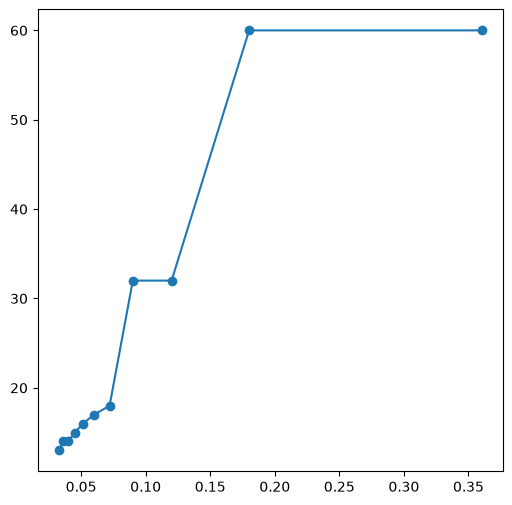

In [6]:
### r0 = 25
r0 = 6.5 * dcore
kh_list = np.array([10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110])
eflat_list = np.array([0.34172005607667, 0.68344011215334, 1.02516016823001, 1.36688022430668, 1.70860028038335, 2.05032033646002, 2.39204039253669, 2.73376044861335, 3.07548050469002, 3.41720056076669, 3.75892061684337])

nmax = 70
mask = np.array(nminlist)<=nmax
eadh = 1
print(mask)
slist = ((t0+dcore) * eadh) / ( 2*eflat_list*r0 )
print(slist)

fig, ax = plt.subplots(1,1,figsize=(6,6))
# ax.plot(x25,y25,"o-",label = f"r0 = 25")
# ax.plot(slist[mask],np.array(nminlist)[mask],"o-",label = f"r0 = {r0}")

ax.plot(slist[mask],np.array(nminlist)[mask],"o-",label = f"sigma = {sigma}")

nconf = np.linspace(0.1,100,100)
hconf = 1*((t0+dcore)/r0)*nconf
ax.plot(1*sconformal(hconf),nconf,"k--",label = f"curv. foc.")

ax.set_xlim(0,0.1)
ax.set_ylim(0,30)
ax.legend(fontsize = 15)
ax.tick_params(labelsize=15)
ax.set_xlabel("$S = \gamma t / B \kappa_0$",fontsize=20)
ax.set_ylabel("N*",fontsize=20)

# x25 = slist[mask]
# y25 = np.array(nminlist)[mask]

In [11]:
##### DIFFERENT R0 LIST #####
r0bar = 13.0 # average curvature 
maxdeltar0 = 2 # largest value of delta k0 between two curvatures
curve_steps = 2 # number of curvature changes between k0bar and maxdeltak0

curvelist = []

for curve_step in range(curve_steps + 1):
    Acurve = r0bar - ((maxdeltar0 / 2) / curve_steps) * curve_step
    Bcurve = r0bar + ((maxdeltar0 / 2) / curve_steps) * curve_step
    
    print(curve_step)
    curvelist.append({'A': Acurve, 'B': Bcurve})

curvelistload = list(curvelist)
curvelistload.insert(0, {'A': r0bar, 'B': r0bar})
curvelistload.pop()  
print(curvelist)
print(curvelistload)


0
1
2
[{'A': 13.0, 'B': 13.0}, {'A': 12.5, 'B': 13.5}, {'A': 12.0, 'B': 14.0}]
[{'A': 13.0, 'B': 13.0}, {'A': 13.0, 'B': 13.0}, {'A': 12.5, 'B': 13.5}]


In [2]:
def shell_list(inc, total):
    inc = int(inc)
    total = int(total)
    l = []
    for i in range(int(total / inc)):
        l.append(i * inc + 1)
    return l

print(shell_list(1
                 , 50))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]


In [89]:
print(nminlist)

[np.int64(50), np.int64(50), np.int64(17), np.int64(13), np.int64(11), np.int64(10), np.int64(9), np.int64(8), np.int64(8), np.int64(8), np.int64(7)]


## Larger Design

ValueError: attempt to get argmin of an empty sequence

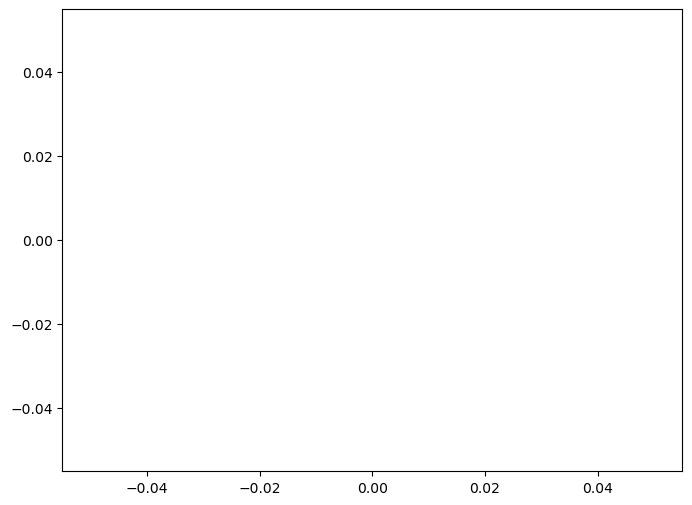

In [19]:
dimension = 2
dcore = 1
wx = 10 #4.9 * dcore
t0 = 0.6 * dcore
r0 = 16 * dcore
pair_ints = "1patch"
soft_ints = True
Nbeads = 30 #15

sigma = 0.25 #0.25 * dcore
# epsilon = 0.004402158148617929
# khlist = [400,600,800,1000,1200]
khlist = [100,200,300,400,500,600,700,800,900,1000]
# khlist = [100]

minstyle = "hftn"
etol = 1e-14

nshell_list = np.arange(1,50+1,1)

fig, ax = plt.subplots(1,1,figsize=(8,6))

nminlist = []
khmin = []

for kh in khlist:
    
    nmols = []
    energies = []
    
    for nshells in nshell_list:
        simpath = f"data/dynamics2D/{int(dimension)}d/emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{Nbeads}/r0-{r0:0.3f}/{pair_ints}-soft-{soft_ints}/sigma-{sigma:0.5f}-kh-{kh:0.3f}/nshells-{nshells}/{minstyle}-{int(np.abs(np.log10(etol)))}"
#         simpath = f"data/examples/{int(dimension)}d/emin/kh-{kh:0.2f}/nshells-{nshells}"
#         simpath = f"data/{int(dimension)}d/sigma-{sigma:0.3f}-kh-{kh:0.2f}/nshells-{nshells}"
#         simpath = f"data/{int(dimension)}d/wx-{wx:0.2f}-t0-{t0:0.2f}-r0-{r0:0.2f}-Nbeads-{Nbeads}-{pair_ints}/sigma-{sigma:0.3f}-kh-{kh:0.2f}/nshells-{nshells}"
#         simpath = f"data/{int(dimension)}d/stack-emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{Nbeads}-r0-{r0:0.3f}/{pair_ints}/sigma-{sigma:0.5f}-soft-{soft_ints}/kh-{kh:0.3f}/nshells-{nshells}"
        try:
            simdir = f"{PROJECT_ROOT}/{simpath}" 
            # logname = "logmd.lammps"
    #             logname = "logemin.lammps"
            result = ReadSim(simdir)
            result.read_log()
            ef = result.energyf    # final energy
            energies.append(ef)
            nmols.append(nshells)
            
        except:
            pass
        
    nmols = np.array(nmols)
    energies = np.array(energies)
    ax.plot(nmols,energies/nmols,"o-",label=f"kh = {kh}")
    imin = np.argmin(energies/nmols)
    nmin = nmols[imin]
    emin = energies[imin]/nmin
    ax.plot(nmin,emin,"ko")
    nminlist.append(nmin)
    khmin.append(kh)

# ax.set_xlim(0,15)
# ax.set_ylim(-0.7,-0.5)
ax.legend(fontsize = 12)
ax.tick_params(labelsize=15)
ax.set_xlabel("Stack Size N",fontsize=20)
ax.set_ylabel("Energy Density E/N",fontsize=20)

In [30]:
r1 = 6.5
r2 = 10
(r2**(4/3)) / (r1**(4/3))

1.7760241127143375

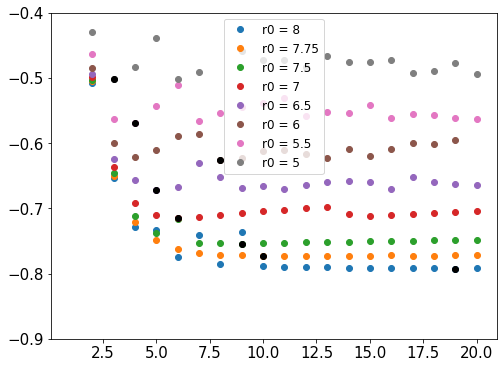

In [97]:
dimension = 2
dcore = 1
wx = 4.9 #4.9 * dcore
t0 = 0.6 * dcore
# r0 = 7.75 #20 * dcore
pair_ints = "1patch"
soft_ints = False 
Nbeads = 15 #15

sigma = 0.25 #0.25 * dcore
# epsilon = 0.004402158148617929
kh = 1000
r0list = [8,7.75,7.5,7,6.5,6,5.5,5]
# r0list = [16,18,20,22,24,26,28,30]


minstyle = "hftn"
etol = 1e-14

nshell_list = np.arange(1,20+1,1)

fig, ax = plt.subplots(1,1,figsize=(8,6))

nminlist = []
khmin = []

for r0 in r0list:
    
    nmols = []
    energies = []
    
    for nshells in nshell_list:
        simpath = f"data/dynamics2D/{int(dimension)}d/emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{Nbeads}/r0-{r0:0.3f}/{pair_ints}-soft-{soft_ints}/sigma-{sigma:0.5f}-kh-{kh:0.3f}/nshells-{nshells}/{minstyle}-{int(np.abs(np.log10(etol)))}"
#         simpath = f"data/examples/{int(dimension)}d/emin/kh-{kh:0.2f}/nshells-{nshells}"
#         simpath = f"data/{int(dimension)}d/sigma-{sigma:0.3f}-kh-{kh:0.2f}/nshells-{nshells}"
#         simpath = f"data/{int(dimension)}d/wx-{wx:0.2f}-t0-{t0:0.2f}-r0-{r0:0.2f}-Nbeads-{Nbeads}-{pair_ints}/sigma-{sigma:0.3f}-kh-{kh:0.2f}/nshells-{nshells}"
#         simpath = f"data/{int(dimension)}d/stack-emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{Nbeads}-r0-{r0:0.3f}/{pair_ints}/sigma-{sigma:0.5f}-soft-{soft_ints}/kh-{kh:0.3f}/nshells-{nshells}"
        try:
            simdir = f"{PROJECT_ROOT}/{simpath}" 
            # logname = "logmd.lammps"
    #             logname = "logemin.lammps"
            result = ReadSim(simdir)
            result.read_log()
            ef = result.energyf    # final energy
            energies.append(ef)
            nmols.append(nshells)
            
        except:
            pass
        
    nmols = np.array(nmols)
    energies = np.array(energies)
    ax.plot(nmols,energies/nmols,"o",label=f"r0 = {r0}")
    imin = np.argmin(energies/nmols)
    nmin = nmols[imin]
    emin = energies[imin]/nmin
    ax.plot(nmin,emin,"ko")
    
    nminlist.append(nmin)
    khmin.append(kh)

# ax.set_xlim(0,41)
ax.set_ylim(-0.9,-0.4)
ax.legend(fontsize = 12)
ax.tick_params(labelsize=15)

In [ ]:
[8,7.75,7.5,7,6.5,6,5.5,5]

In [ ]:
[19,10,9,6,5,4,4,3]

# DNA Origami

Text(0, 0.5, 'Energy Density E/N')

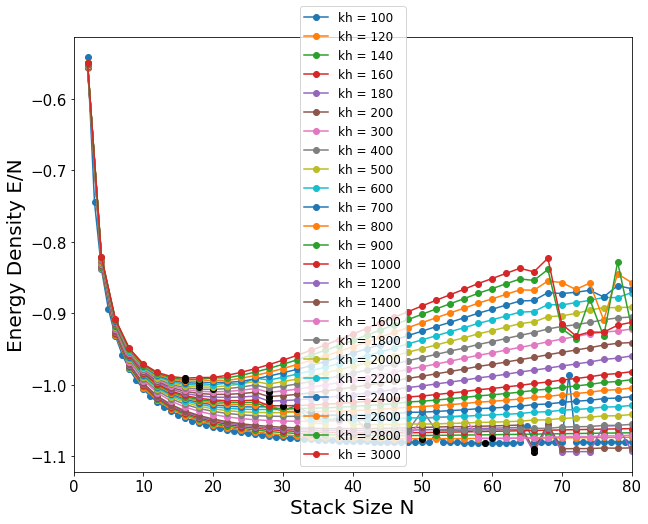

In [313]:
dimension = 2
dcore = 1
wx = 46 * dcore
t0 = 0.6 * dcore
# r0 = 25 * dcore
r0 = 50 * dcore
pair_ints = "1patch"
soft_ints = False
Nbeads = 130

sigma = 0.25 * dcore
khlist = [100,120,140,160,180,200,300,400,500,600,700,800,900,1000,
          1200,1400,1600,1800,2000,2200,2400,2600,2800,3000]
# khlist = [3000]


minstyle = "cg"
# etol = 1e-14
etol = 1e-10


# nshell_list = np.arange(1,50+1,1)
nshell_list = np.arange(1,100+1,1)

fig, ax = plt.subplots(1,1,figsize=(10,8))

nminlist = []
khmin = []

for kh in khlist:
    
    nmols = []
    energies = []
    ebonds = []
    epairs = []
    
    worked = 0
    
    for nshells in nshell_list:
        simpath = f"data/DNA/{int(dimension)}d/emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{int(Nbeads)}/r0-{r0:0.3f}/sigma-{sigma:0.5f}/kh-{kh:0.5f}/nshells-{nshells}/{minstyle}-{int(np.abs(np.log10(etol)))}"
        try:
            simdir = f"{PROJECT_ROOT}/{simpath}" 
            # logname = "logmd.lammps"
    #             logname = "logemin.lammps"
            result = ReadSim(simdir)
            result.read_log()
            ef = result.energyf    # final energy
            energies.append(ef)
            nmols.append(nshells)
            ebonds.append(result.thermo_E_bond[-1])
            epairs.append(result.thermo_E_pair[-1])
            worked = 1
            
        except:
            pass
        
    if worked == 1:
        nmols = np.array(nmols)
        energies = np.array(energies)
        ebonds = np.array(ebonds)
        epairs = np.array(epairs)
        ax.plot(nmols,energies/nmols,"o-",label=f"kh = {kh}")
        imin = np.argmin(energies/nmols)
        nmin = nmols[imin]
        emin = energies[imin]/nmin
        ax.plot(nmin,emin,"ko")
        nminlist.append(nmin)
        khmin.append(kh)

ax.set_xlim(0,80)
# ax.set_ylim(-1.1,-0.8)
ax.legend(fontsize = 12)
ax.tick_params(labelsize=15)
ax.set_xlabel("Stack Size N",fontsize=20)
ax.set_ylabel("Energy Density E/N",fontsize=20)

In [306]:
0.34*8

2.72

Text(0, 0.5, 'Excess Energy Density E/N')

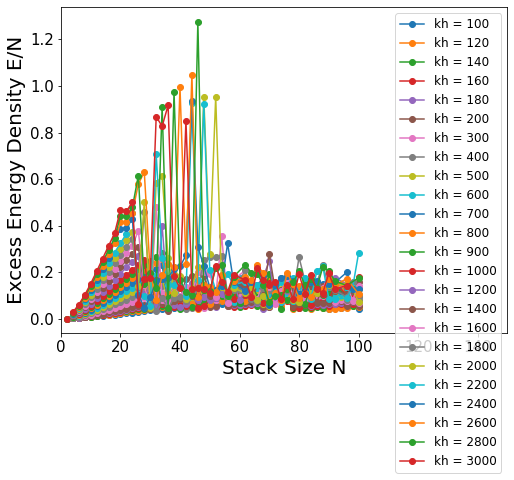

In [307]:
fig, ax = plt.subplots(1,1,figsize=(8,6))

for kh in khlist:
    nmols = []
    energies = []
    ebonds = []
    epairs = []
    
    worked = 0
    
    for nshells in nshell_list:
        simpath = f"data/DNA/{int(dimension)}d/emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{int(Nbeads)}/r0-{r0:0.3f}/sigma-{sigma:0.5f}/kh-{kh:0.5f}/nshells-{nshells}/{minstyle}-{int(np.abs(np.log10(etol)))}"
        try:
            simdir = f"{PROJECT_ROOT}/{simpath}" 
            # logname = "logmd.lammps"
    #             logname = "logemin.lammps"
            result = ReadSim(simdir)
            result.read_log()
            ef = result.energyf    # final energy
            energies.append(ef)
            nmols.append(nshells)
            ebonds.append(result.thermo_E_bond[-1])
            epairs.append(result.thermo_E_pair[-1])
            worked = 1
        except:
            pass
    
    if worked == 1:
        nmols = np.array(nmols)
        energies = np.array(energies)
        ebonds = np.array(ebonds)
        epairs = np.array(epairs)
        ax.plot(nmols,ebonds/nmols,"o-",label=f"kh = {kh}")

ax.set_xlim(0,150)
# ax.set_ylim(-0.7,-0.5)
ax.legend(fontsize = 12)
ax.tick_params(labelsize=15)
ax.set_xlabel("Stack Size N",fontsize=20)
ax.set_ylabel("Excess Energy Density E/N",fontsize=20)

In [194]:
nminlist

[100,
 100,
 100,
 46,
 44,
 42,
 36,
 34,
 32,
 30,
 28,
 28,
 26,
 26,
 24,
 24,
 22,
 22,
 22,
 20,
 20,
 20,
 20,
 20]

In [18]:
def sconformal(h):
    return (2-2*np.sqrt(h**2+1))/h + np.arcsinh(h)

Text(0, 0.5, 'N*')

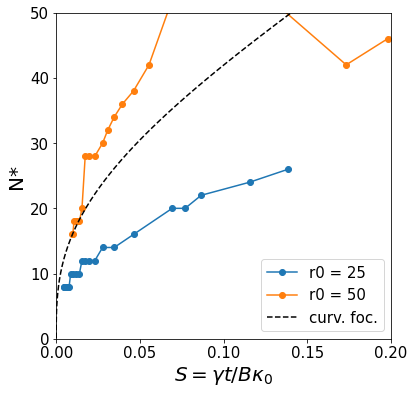

In [316]:
### r0 = 50
r0 = 50
kh_list = np.array([100, 120, 140, 160, 180, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1200, 1400, 1600, 1800, 2000, 2200, 2400, 2600, 2800, 3000])
eflat_list = np.array([0.0577220008298142, 0.069266400995777, 0.0808108011617399, 0.0923552013277028, 0.103899601493666, 0.115444001659628, 0.173166002489443, 0.230888003319257, 0.288610004149071, 0.346332004978885, 0.404054005808699, 0.461776006638513, 0.519498007468328, 0.577220008298143, 0.692664009957771, 0.808108011617399, 0.923552013277026, 1.03899601493666, 1.15444001659628, 1.26988401825591, 1.38532801991554, 1.50077202157517, 1.6162160232348, 1.73166002489443])
eadh = 1


nmax = 60
mask = np.array(nminlist)<=nmax

slist = ((t0+dcore) * eadh) / ( 2*eflat_list*r0 )

fig, ax = plt.subplots(1,1,figsize=(6,6))
ax.plot(x25,y25,"o-",label = f"r0 = 25")
ax.plot(slist[mask],np.array(nminlist)[mask],"o-",label = f"r0 = {r0}")

# ax.plot(slist[mask],np.array(nminlist)[mask],"o-",label = f"sigma = {sigma}")
nconf = np.linspace(0.1,100,100)
hconf = 1*((t0+dcore)/r0)*nconf
ax.plot(1*sconformal(hconf),nconf,"k--",label = f"curv. foc.")

ax.set_xlim(0,0.2)
ax.set_ylim(0,50)
ax.legend(fontsize = 15)
ax.tick_params(labelsize=15)
ax.set_xlabel("$S = \gamma t / B \kappa_0$",fontsize=20)
ax.set_ylabel("N*",fontsize=20)

[False False False False False  True  True  True  True  True  True]
[0.36016886 0.18008443 0.12005629 0.09004222 0.07203377 0.06002814
 0.05145269 0.04502111 0.04001876 0.03601689 0.03274262]


Text(0, 0.5, 'N*')

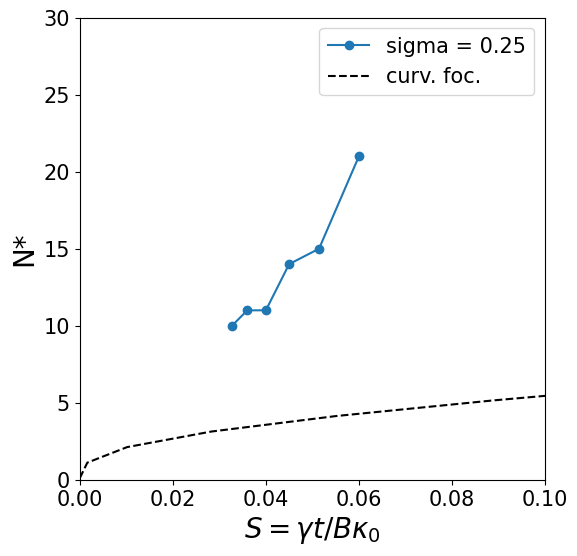

In [22]:
### r0 = 25
r0 = 6.5 * dcore
kh_list = np.array([10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110])
eflat_list = np.array([0.34172005607667, 0.68344011215334, 1.02516016823001, 1.36688022430668, 1.70860028038335, 2.05032033646002, 2.39204039253669, 2.73376044861335, 3.07548050469002, 3.41720056076669, 3.75892061684337])

nmax = 40
mask = np.array(nminlist)<=nmax
eadh = 1
print(mask)
slist = ((t0+dcore) * eadh) / ( 2*eflat_list*r0 )
print(slist)

fig, ax = plt.subplots(1,1,figsize=(6,6))
# ax.plot(x25,y25,"o-",label = f"r0 = 25")
# ax.plot(slist[mask],np.array(nminlist)[mask],"o-",label = f"r0 = {r0}")

ax.plot(slist[mask],np.array(nminlist)[mask],"o-",label = f"sigma = {sigma}")

nconf = np.linspace(0.1,100,100)
hconf = 1*((t0+dcore)/r0)*nconf
ax.plot(1*sconformal(hconf),nconf,"k--",label = f"curv. foc.")

ax.set_xlim(0,0.1)
ax.set_ylim(0,30)
ax.legend(fontsize = 15)
ax.tick_params(labelsize=15)
ax.set_xlabel("$S = \gamma t / B \kappa_0$",fontsize=20)
ax.set_ylabel("N*",fontsize=20)

# x25 = slist[mask]
# y25 = np.array(nminlist)[mask]

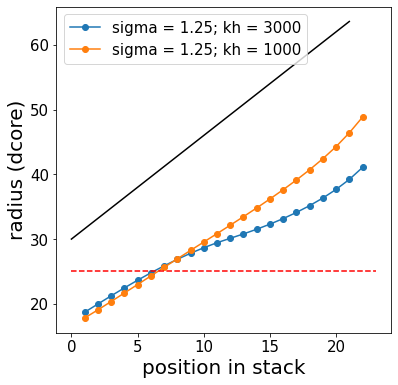

In [263]:
### read dump file
dimension = 2
wx = 46
t0 = 0.6
Nbeads = 130
r0 = 25
sigma = 1.25
khlist = [3000,1000]
minstyle = "cg"
etol = 1e-10
nshells = 22

fig, ax = plt.subplots(1,1,figsize=(6,6))

for kh in khlist:
    simpath = f"data/DNA/{int(dimension)}d/emin/wx-{wx:0.3f}-t0-{t0:0.3f}-Nbeads-{int(Nbeads)}/r0-{r0:0.3f}/sigma-{sigma:0.5f}/kh-{kh:0.5f}/nshells-{nshells}/{minstyle}-{int(np.abs(np.log10(etol)))}"
    simdir = f"{PROJECT_ROOT}/{simpath}"
    readall = True

    result = ReadSim(simdir)
    dumpname = result.latest_file(file="trajectory")
    result.read_dump(dumpname=dumpname,readall=readall)

    frame = -1
    molid = []
    radii = []
    for i in np.arange(1,nshells+1,1):
        mol = i
        rfit = molradius(result,frame,mol)
        molid.append(mol)
        radii.append(rfit)


    ax.plot(np.arange(nshells)+1,np.array(radii),"o-",label = f"sigma = {sigma}; kh = {kh}")

# ax.set_xlim(0,0.2)
# ax.set_ylim(0,50)
ax.legend(fontsize = 15)
ax.tick_params(labelsize=15)
ax.set_xlabel("position in stack",fontsize=20)
ax.set_ylabel("radius (dcore)",fontsize=20)
ax.hlines(r0,xmin=0,xmax=nshells+1,linestyle="dashed",color="red")
ax.plot(np.arange(nshells),((t0+dcore)) * np.arange(nshells)+30,"k-")

In [226]:
frame = -1
molid = []
radii = []
for i in np.arange(1,nshells+1,1):
    mol = i
    rfit = molradius(result,frame,mol)
    molid.append(mol)
    radii.append(rfit)

In [227]:
radii

[39.94863426838186,
 41.61660182966327,
 43.220998144773255,
 44.750914119820656,
 46.20856641056594,
 47.58328085821178,
 48.88166118670278,
 50.13727692765814,
 51.35990632669363,
 52.5635697379027,
 53.76247431932353,
 54.975284123714744,
 56.22211321664611,
 57.526314697909285,
 58.92017249730113,
 60.438543983952286,
 62.13052200742711,
 64.05977327317497,
 66.30894325037238,
 68.93773725299546]

In [22]:
ebonds

array([], dtype=float64)

In [113]:
nshells = 101
px = 1    # number of cpus along x
py = 1
#pz = 1
pmax = 5    # max number of cpus per job
nchunk = 20
if nshells<=nchunk*(pmax-1):
    pz = int(np.floor((nshells-1)/(nchunk))+1)
else:
    pz = int(pmax)
pz

5

In [145]:
len(khlist)*7

168